<h1 style="text-align: center;"> Student Performance from Game Play - Exploratory Data Analysis</h1>
<h2><center> <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/e/e3/Video_Game_Book.svg/480px-Video_Game_Book.svg.png" alt="EducationGame img"></center></h2>

## Table of Contents
* [1. Data basic overview](#data-basic-overview)
    * [Optional step: optimize memory usage](#optimize-memory-usage)
    * [Train and test data](#data-basic-overview-train-test)
    * [Labels data](#data-basic-overview-labels)
* [2. Exploring data](#exploring-data)
    * [2.1 session_id](#session-id)
    * [2.2 index](#index)
    * [2.3 elapsed_time](#elapsed-time)
    * [2.4 event properties: name, type, and id](#event-properties)
    * [2.5. game room](#game-room)
    * [2.6 level and level_group](#level)
    * [2.7 click geo-location](#click-geo-location)
    * [2.8 text](#text)
    * [2.9 page](#page)
    * [2.10 hover](#hover)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from wordcloud import WordCloud
import warnings

# settings
sns.set(style="whitegrid", color_codes=True)
warnings.filterwarnings("ignore")

## 1. Data basic overview <a class="anchor" id="data-basic-overview"></a>

The goal of the competition is to predict the performance of game-based learning from game logs. The data include: 
- training set with game sessions data (`train.csv`);
- correct answers for all questions for each session (`train_labels.csv`);
- test set with game sessions data (`test.csv`);
- sample submission file (`sample_submission.csv`).


In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
labels = pd.read_csv('train_labels.csv')

print('Train data shape:', train.shape)
print('Test data shape:', test.shape)
print('Labels data shape:', labels.shape)

Train data shape: (13174211, 20)
Test data shape: (3728, 21)
Labels data shape: (212022, 2)


### Optional step: optimize memory usage <a class="anchor" id="optimize-memory-usage"></a>

Since data is relatively large it makes sense to optimize memory usage by changing data types. I will use `reduce_memory_usage` function (the original version is available at [this notebook](https://www.kaggle.com/code/arjanso/reducing-dataframe-memory-size-by-65)).

Alternative solutions:
- assign data types [during csv read](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384359);
- install and use additional library, such as [clean_df](https://clean-df.readthedocs.io/en/latest/usage.html) or [dataprep](https://docs.dataprep.ai/user_guide/clean/clean_df.html)

In [3]:
def reduce_memory_usage(df, df_name):
    start_mem = df.memory_usage(index=True, deep=True).sum() / 1024**2
    print(f'Initial memory usage of {df_name} dataframe is {round(start_mem, 2)} MB')    
    for col in df.columns:
        col_type = df[col].dtype.name
        if ((col_type != 'datetime64[ns]') & (col_type != 'category')):
            if (col_type != 'object'):
                c_min = df[col].min()
                c_max = df[col].max()
                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)
                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float16)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        pass
            else:
                df[col] = df[col].astype('category')
    mem_usg = df.memory_usage(index=True, deep=True).sum() / 1024**2 
    print(f"Memory usage of {df_name} became: {round(mem_usg, 2)} MB")    
    return df

train = reduce_memory_usage(train, 'train')
test = reduce_memory_usage(test, 'test')
#labels = reduce_memory_usage(labels, 'labels')

Initial memory usage of train dataframe is 6908.33 MB
Memory usage of train became: 779.06 MB
Initial memory usage of test dataframe is 2.21 MB
Memory usage of test became: 0.3 MB


### Train and test data <a class="anchor" id="data-basic-overview-train-test"></a>

In [5]:
print("Sample of train data:")
train.head()

Sample of train data:


,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,NaN,NaN,NaN,0-4
1,20090312431273200,1,1323,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
2,20090312431273200,2,831,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
3,20090312431273200,3,1147,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
4,20090312431273200,4,1863,person_click,basic,0,NaN,-412.991405,-159.314686,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4


In [5]:
print("Sample of test data:")
test.head()

Sample of test data:


,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,...,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group,session_level
0,20090109393214576,0,0,cutscene_click,basic,0,NaN,-414.0,75.6875,380.0,...,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,NaN,NaN,NaN,0-4,20090109393214576_0-4
1,20090109393214576,1,1965,person_click,basic,0,NaN,-106.0,-63.3125,688.0,...,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4,20090109393214576_0-4
2,20090109393214576,2,3614,person_click,basic,0,NaN,-419.0,47.6875,375.0,...,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4,20090109393214576_0-4
3,20090109393214576,3,5330,person_click,basic,0,NaN,-111.0,-57.3125,683.0,...,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4,20090109393214576_0-4
4,20090109393214576,4,6397,person_click,basic,0,NaN,-111.0,-57.3125,683.0,...,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4,20090109393214576_0-4


In [6]:
print("Train data statistics:")
train.describe().apply(lambda x: x.apply('{0:.1f}'.format))

Train data statistics:


,session_id,index,elapsed_time,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,fullscreen,hq,music
count,13174211.0,13174211.0,13174211.0,13174211.0,284746.0,12137971.0,12137971.0,12137971.0,12137971.0,1000737.0,0.0,0.0,0.0
mean,21134134855458160.0,652.6,3846817.3,12.2,3.2,-54.9,-116.3,458.1,385.2,3186.2,nan,nan,nan
std,566522042999546.6,627.6,27013866.5,6.5,2.1,520.1,218.6,247.2,129.3,369226.5,nan,nan,nan
min,20090312431273200.0,0.0,0.0,0.0,0.0,-1992.4,-918.2,0.0,0.0,0.0,nan,nan,nan
25%,21010310162137956.0,289.0,439430.0,6.0,1.0,-352.9,-212.8,269.0,304.0,100.0,nan,nan,nan
50%,21040215432620068.0,596.0,1013425.0,13.0,3.0,-11.2,-97.8,447.0,397.0,418.0,nan,nan,nan
75%,21100514325903272.0,897.0,1740050.0,18.0,5.0,296.4,22.7,663.0,471.0,1266.0,nan,nan,nan
max,22100221145014656.0,20473.0,1749293395.0,22.0,6.0,1261.8,543.6,1916.0,1439.0,219907810.0,nan,nan,nan


In [7]:
print("Test data statistics:")
test.describe().apply(lambda x: x.apply('{0:.1f}'.format))

Test data statistics:


,session_id,index,elapsed_time,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,fullscreen,hq,music
count,3728.0,3728.0,3728.0,3728.0,153.0,3366.0,3366.0,3366.0,3366.0,353.0,0.0,0.0,0.0
mean,20090243557328456.0,670.4,2065026.1,12.2,3.4,-14.7,-131.1,463.7,394.4,1415.6,nan,nan,nan
std,95990420522.9,411.2,2079750.0,6.3,2.0,511.1,224.0,243.7,133.5,2664.6,nan,nan,nan
min,20090109393214576.0,0.0,0.0,0.0,0.0,-1913.1,-908.3,0.0,10.0,15.0,nan,nan,nan
25%,20090109393214576.0,320.0,570875.0,7.0,2.0,-290.1,-232.8,278.2,320.2,83.0,nan,nan,nan
50%,20090312143683264.0,642.0,1174912.0,11.0,4.0,16.8,-109.0,460.0,408.0,416.0,nan,nan,nan
75%,20090312331414616.0,983.2,2481633.8,18.0,5.0,355.1,1.0,680.0,486.0,1316.0,nan,nan,nan
max,20090312331414616.0,1563.0,6524025.0,22.0,6.0,1214.9,489.5,879.0,658.0,23451.0,nan,nan,nan


In [8]:
stat = pd.DataFrame([train.nunique(), test.nunique()]).T.fillna(0)
stat.columns = ['Number of unique values in train', 'Number of unique values in test']
stat.head(30).style.format("{:,.0f}").background_gradient(cmap='YlGn')

,Number of unique values in train,Number of unique values in test
session_id,"11,779",3
index,"20,348","1,564"
elapsed_time,"3,804,019","3,720"
event_name,11,11
name,6,6
level,23,23
page,7,7
room_coor_x,"9,120,274","3,146"
room_coor_y,"7,047,316","2,668"
screen_coor_x,"35,331",801


AttributeError: 'AxesSubplot' object has no attribute 'bar_label'

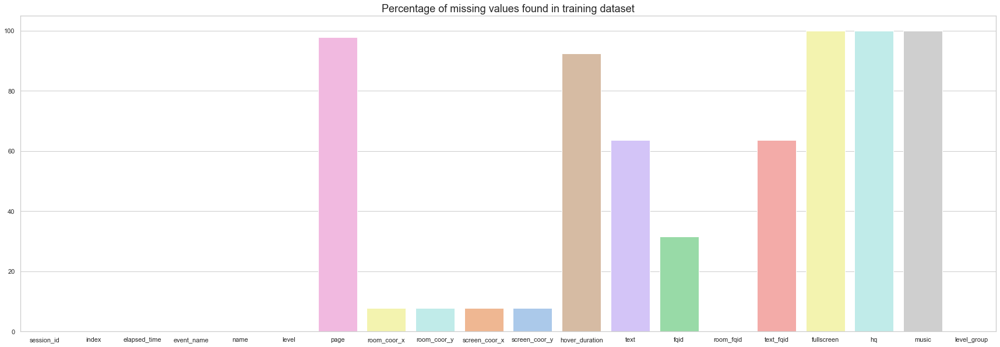

In [14]:
train_missing = train.isna().sum() / len(train) *100
plt.figure(figsize=(30, 10))
pal = sns.color_palette("pastel", len(train_missing))
rank = train_missing.argsort().argsort()
g = sns.barplot(x=train_missing.index, y=train_missing, palette=np.array(pal[::])[rank])
g.axes.set_title("Percentage of missing values found in training dataset", fontsize=18)
g.bar_label(g.containers[0], fmt="%.1f%%")
g.xaxis.set_tick_params(rotation=35)
del train_missing, g, pal, rank

AttributeError: 'AxesSubplot' object has no attribute 'bar_label'

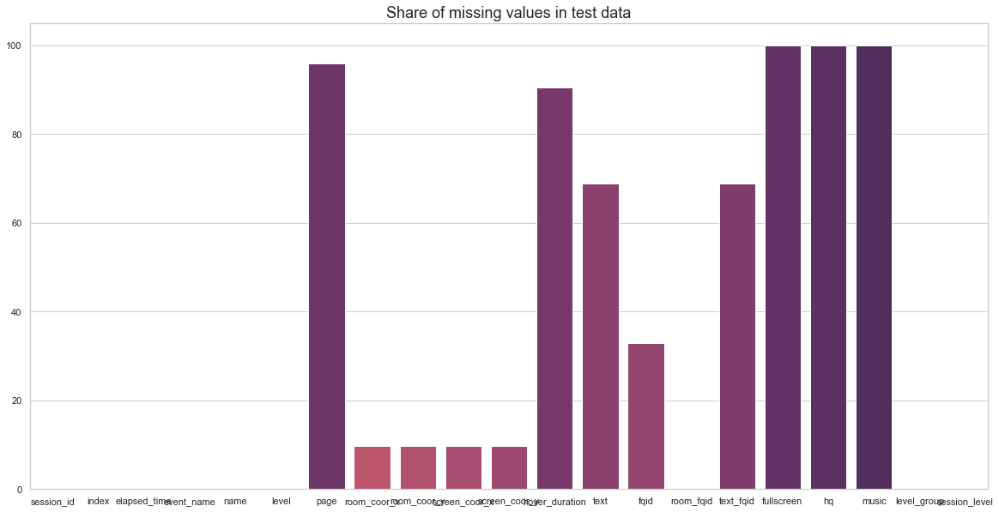

In [11]:
test_missing = test.isna().sum() / len(test) *100
plt.figure(figsize=(20, 10))
pal = sns.color_palette("flare", len(test_missing))
rank = test_missing.argsort().argsort()
g = sns.barplot(x=test_missing.index, y=test_missing, palette=np.array(pal[::])[rank])
g.axes.set_title("Share of missing values in test data", fontsize=18)
g.bar_label(g.containers[0], fmt="%.1f%%")
g.xaxis.set_tick_params(rotation=35)
del test_missing, g, pal, rank

Some columns are missing (`fullscreen`, `hq`, `music`) on both train and test, so its safe to drop them from the dataset:

In [11]:
train.drop(columns=['fullscreen', 'hq', 'music'], inplace=True)
test.drop(columns=['fullscreen', 'hq', 'music'], inplace=True)

### Labels data <a class="anchor" id="data-basic-overview-labels"></a>

`train_labels.csv` includes two values:
- `session_id`: does not equal to session_id from the training set, this is combination `<session_id>_<question #>`;
- `correct`: flag for correct (1) or incorrect (0) answer.

Note that during gameplay the player must eventually select the correct answer to continue. A "correct answer" here indicates that the player got the answer correct on their first attempt. For the list of quizzes see [Game Walkthrough](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384796) by [@pjmathematician](https://www.kaggle.com/pjmathematician). 

In [12]:
print("Sample of labels data:")
labels.head()

Sample of labels data:


,session_id,correct
0,20090312431273200_q1,1
1,20090312433251036_q1,0
2,20090314121766812_q1,1
3,20090314363702160_q1,1
4,20090314441803444_q1,1


In [13]:
labels.describe().T

,count,mean,std,min,25%,50%,75%,max
correct,212022.0,0.703946,0.456516,0.0,0.0,1.0,1.0,1.0


About 70% of the answers are correct, so the dataset is slightly imbalanced. Correctness varies across questions:

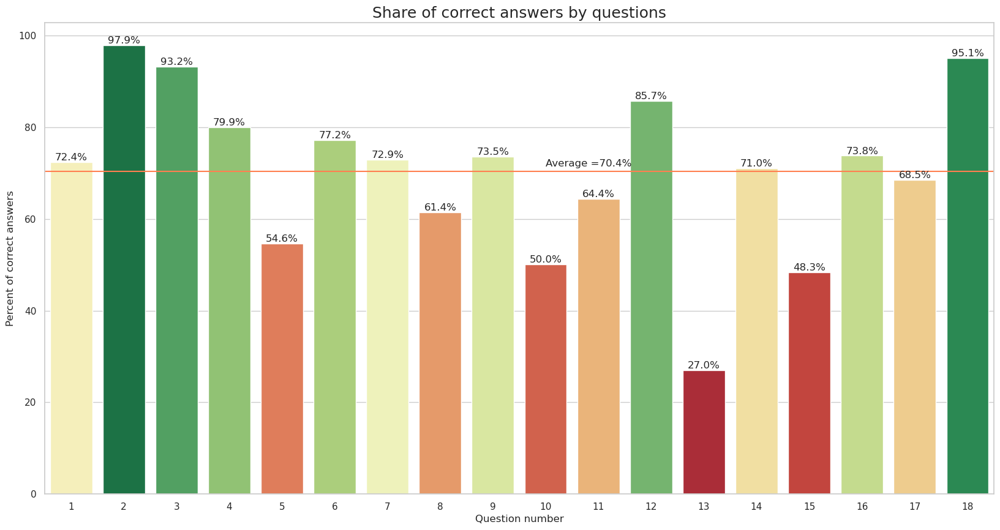

In [14]:
labels[['session_id_id', 'question_number']] = labels['session_id'].str.split('_', 1, expand=True)
labels['session_id_id'] = labels['session_id_id'].astype(np.int64)
mean_correct = (labels['correct'].mean()*100).astype(np.float64)

labels_perc = labels.groupby('question_number')['correct'].value_counts(normalize=True).mul(100).rename('Percent').reset_index()
labels_perc['number'] = labels_perc['question_number'].apply(lambda x: int(x[1:])).astype(np.int64)
labels_perc = labels_perc[labels_perc['correct'] == 1]
pal = sns.color_palette("RdYlGn", len(labels_perc))
rank = labels_perc.sort_values('number')['Percent'].argsort().argsort()
plt.figure(figsize=(20, 10))
g = sns.barplot(data=labels_perc, x='number', y="Percent", palette=np.array(pal[::])[rank])
g.axhline(mean_correct, color="coral")
plt.text(9, mean_correct+1, f'Average ={round(mean_correct, 1)}%')
g.axes.set_title("Share of correct answers by questions", fontsize=18)
g.set(xlabel='Question number', ylabel='Percent of correct answers')
g.bar_label(g.containers[0], fmt="%.1f%%")
del g, labels_perc, pal, rank, mean_correct

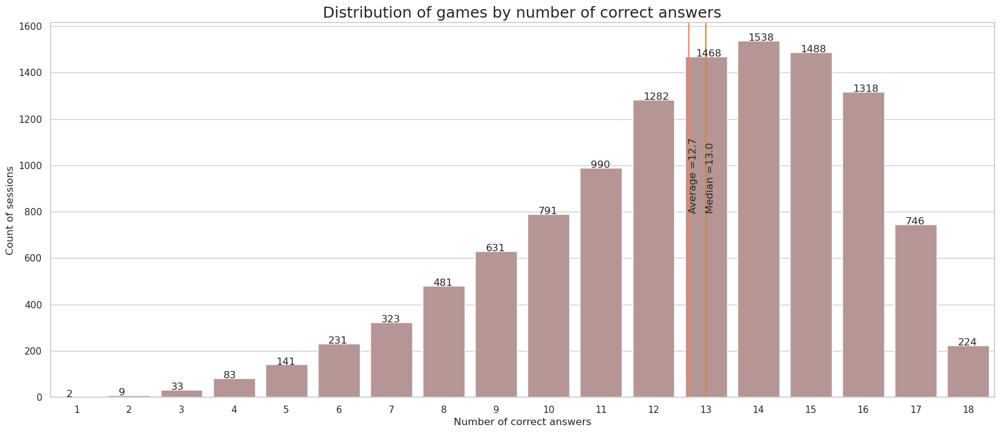

In [15]:
correct_answers_per_session = labels.groupby('session_id_id')['correct'].sum()
mean_correct_answers_per_session = correct_answers_per_session.mean()
median_correct_answers_per_session = correct_answers_per_session.median()
correct_answers_per_session = correct_answers_per_session.value_counts()
plt.figure(figsize=(20, 8))
g = sns.barplot(x=correct_answers_per_session.index, y=correct_answers_per_session.values, color='rosybrown')
plt.title('Distribution of games by number of correct answers', fontsize=18)
g.set_xticklabels(['{}'.format(int(num + 1)) for num in g.get_xticks()])
g.set(xlabel='Number of correct answers', ylabel='Count of sessions')
g.axvline(x=mean_correct_answers_per_session-1, color="coral")
g.text(mean_correct_answers_per_session-1, 800, f'Average ={round(mean_correct_answers_per_session, 1)}', rotation=90)
g.axvline(x=median_correct_answers_per_session-1, color="peru")
g.text(median_correct_answers_per_session-1, 800, f'Median ={round(median_correct_answers_per_session, 1)}', rotation=90)
for i, v in enumerate(correct_answers_per_session.sort_index().values):
    plt.text(i-0.2, v, str(int(v)))
del correct_answers_per_session, mean_correct_answers_per_session, median_correct_answers_per_session, i, v
plt.show()

## 2. Exploring data <a class="anchor" id="exploring-data"></a>

Jo Wilder game is an example of the point-and-click genre. To progress through a game, the player must find hidden objects and/or answer quizzes.

Data matched to the game setup:
- each game is a session defined by `session_id`
- each row in the data is a game event, defined by `name`, type (`event_name`), unique ID (`fqid`), and game progress index (`index`)
- the player progresses by moving from one game room (`room_fqid`) and level (`level`) to another
- remaining columns refer to specific events:
    - for click events, the coordinates of the click are defined in `room_coor_x` and `room_coor_y` (in reference to the in-game room) or in `screen_coor_x` and `screen_coor_y` (in reference to the player’s screen).
    - for notebook-related events `page` identifies the page number;
    - for hover events `hover_duration` shows how long was the hover.

You can play the game here: https://pbswisconsineducation.org/jowilder/play-the-game/

The game code source is public: https://github.com/fielddaylab/jo_wilder

[![Introducing Jo Wilder and the Capitol Case](https://i.imgur.com/EUpzSHK.png)](http://www.youtube.com/watch?v=GCBRRmm7T9k "Introducing Jo Wilder and the Capitol Case")

### 2.1 session_id <a class="anchor" id="session-id"></a>

`session_id` is the ID of the session the event took place in. We have 11779 unique sessions in the train, but only 3 in the test.

In [16]:
train_events_counts = train['session_id'].value_counts()
test_events_counts = test['session_id'].value_counts()

stat = pd.DataFrame([train_events_counts.describe().index,
                    np.round(train_events_counts.describe(), 2).values,
                    np.round(test_events_counts.describe(), 2).values]).T
stat.columns = [' ', 'train', 'test']
stat[['train', 'test']] = stat[['train', 'test']].astype(np.float64)
print(f'Unique sessions in train: {len(train_events_counts)}')
print(f'Unique sessions in test: {len(test_events_counts)}')
print('\n\nStatistics of events per session:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Unique sessions in train: 11779
Unique sessions in test: 3


Statistics of events per session:


,train,test
mean,1118.5,1242.7
std,372.8,268.5
min,634.0,965.0
25%,902.5,1113.5
50%,1035.0,1262.0
75%,1232.0,1381.5
max,19032.0,1501.0


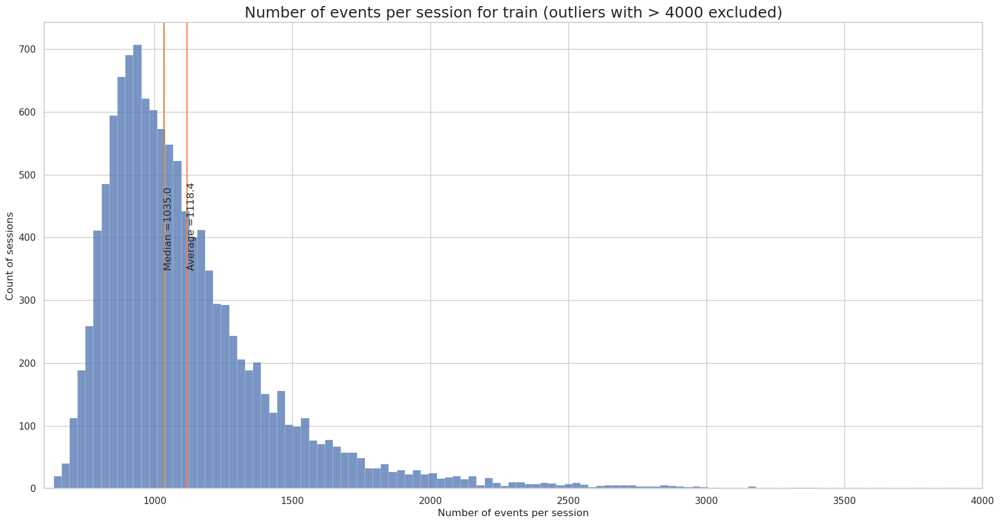

In [17]:
mean_train_events_counts = train_events_counts.mean()
median_train_events_counts = train_events_counts.median()
plt.figure(figsize=(20, 10))
g = sns.histplot(data=train_events_counts)
plt.title('Number of events per session for train (outliers with > 4000 excluded)', fontsize=18)
g.set(xlabel='Number of events per session', ylabel='Count of sessions')
plt.axvline(x=mean_train_events_counts, color="coral")
plt.text(mean_train_events_counts, 350, f'Average ={round(mean_train_events_counts, 1)}', rotation=90)
plt.axvline(x=median_train_events_counts, color="peru")
plt.text(median_train_events_counts, 350, f'Median ={round(median_train_events_counts, 1)}', rotation=90)
plt.xlim(600, 4000)
plt.show()
del train_events_counts, mean_train_events_counts, median_train_events_counts, test_events_counts, stat, g

For train, the distribution seems to be normal with a slight positive skew. The mean and median number of events per session are around 1100. For the test there are only 3 unique sessions, so the same analysis makes no sense.


Next, as noticed by [@pdnartreb](https://www.kaggle.com/pdnartreb) in their [notebook](https://www.kaggle.com/code/pdnartreb/session-id-reverse-engineering), `session_id` likely contains date and time information. Let's review this metadata:

In [18]:
def get_session_id_features(data):
    session_ids = pd.DataFrame()
    session_ids['session_id'] = data['session_id'].unique()
    session_ids['year'] = session_ids['session_id'].apply(lambda x: int(str(x)[:2])).astype(np.uint8)
    session_ids['month'] = session_ids['session_id'].apply(lambda x: int(str(x)[2:4]) + 1).astype(np.uint8)
    session_ids['weekday'] = session_ids['session_id'].apply(lambda x: int(str(x)[4:6])).astype(np.uint8)
    session_ids['hour'] = session_ids['session_id'].apply(lambda x: int(str(x)[6:8])).astype(np.uint8)
    session_ids['minute'] = session_ids['session_id'].apply(lambda x: int(str(x)[8:10])).astype(np.uint8)
    session_ids['second'] = session_ids['session_id'].apply(lambda x: int(str(x)[10:12])).astype(np.uint8)
    session_ids['ms'] = session_ids['session_id'].apply(lambda x: int(str(x)[12:15])).astype(np.uint16)
    session_ids['unknown_part'] = session_ids['session_id'].apply(lambda x: int(str(x)[15:17])).astype(np.uint8)
    return session_ids

train_session_ids = get_session_id_features(train)
test_session_ids = get_session_id_features(test)
train_session_ids.head()

,session_id,year,month,weekday,hour,minute,second,ms,unknown_part
0,20090312431273200,20,10,3,12,43,12,732,0
1,20090312433251036,20,10,3,12,43,32,510,36
2,20090314121766812,20,10,3,14,12,17,668,12
3,20090314363702160,20,10,3,14,36,37,21,60
4,20090314441803444,20,10,3,14,44,18,34,44


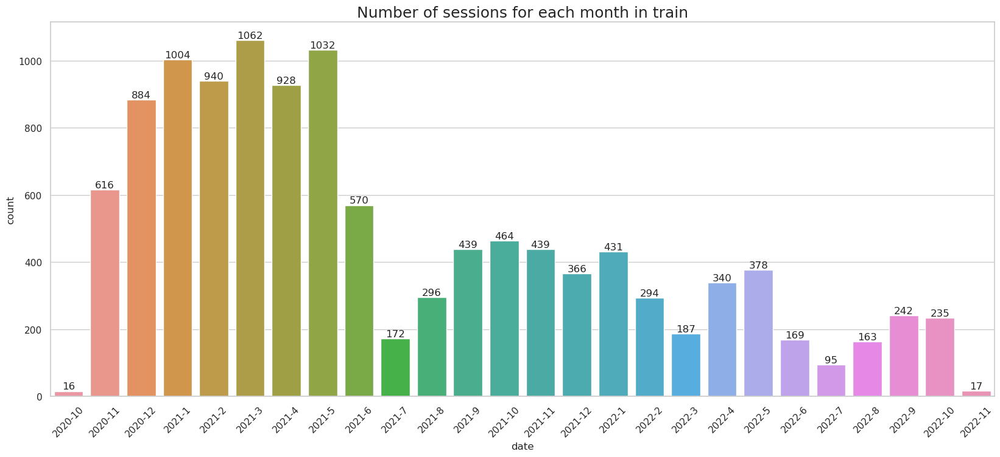

In [19]:
train_session_ids['year'] = train_session_ids['year'] + 2000
train_session_ids['date'] = (train_session_ids['year']).astype(str) + '-' + (train_session_ids['month']).astype(str)
plt.figure(figsize=(20, 8))
g = sns.countplot(x='date', data=train_session_ids)
plt.title('Number of sessions for each month in train', fontsize=18)
g.set_yticklabels(['{}'.format(int(num)) for num in g.get_yticks()])
g.bar_label(g.containers[0])
g.xaxis.set_tick_params(rotation=45)
plt.show()

So, our train data from Oct 2020 to Nov 2022. The game is mostly played in August-December, which corresponds to the beginning of the school year.

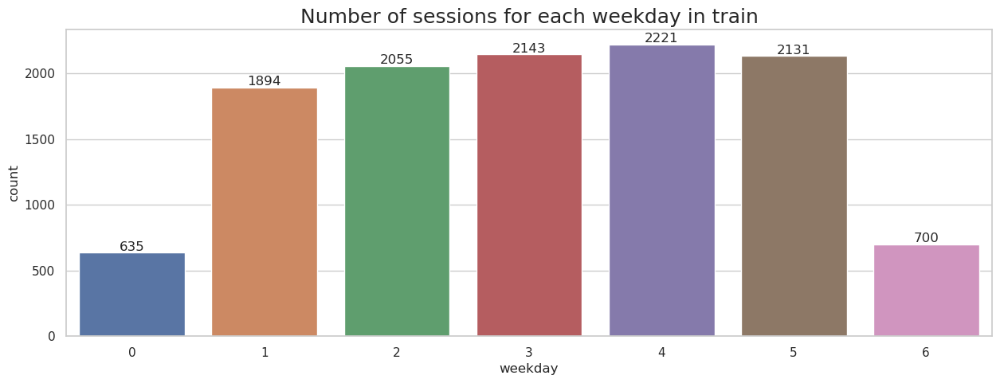

In [20]:
plt.figure(figsize=(15, 5))
g = sns.countplot(x='weekday', data=train_session_ids)
plt.title('Number of sessions for each weekday in train', fontsize=18)
g.set_yticklabels(['{}'.format(int(num)) for num in g.get_yticks()])
g.bar_label(g.containers[0])
g.xaxis.set_tick_params()
plt.show()

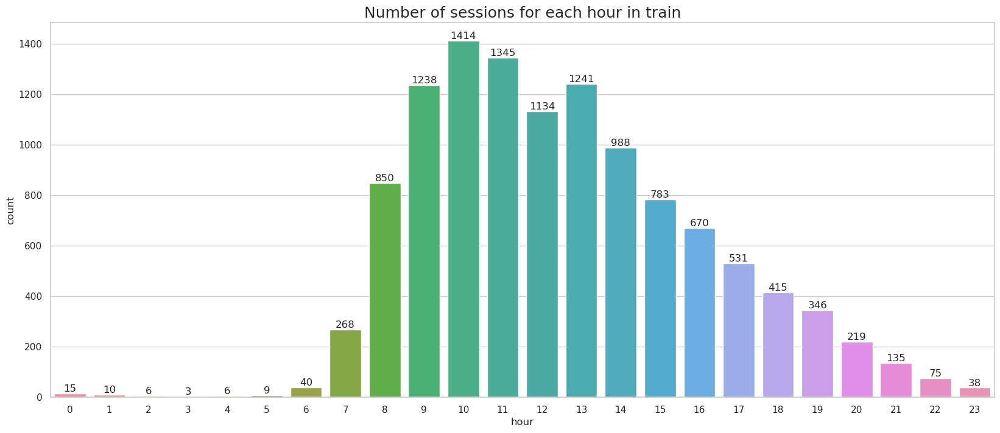

In [21]:
plt.figure(figsize=(20, 8))
g = sns.countplot(x='hour', data=train_session_ids)
plt.title('Number of sessions for each hour in train', fontsize=18)
g.set_yticklabels(['{}'.format(int(num)) for num in g.get_yticks()])
g.bar_label(g.containers[0])
g.xaxis.set_tick_params()
plt.show()
del train_session_ids, g

Just as expected, the game is mostly played during the school days (monday to friday) and working hours (from 8 A.M. to 18 P.M.).

### 2.2 index <a class="anchor" id="index"></a>

`index` is the index of the event for the session. Despite naive expectation, combination of `session_id` and `index` is not unique, there are duplicates:

In [22]:
idx = train[['session_id', 'index']]
idx_dupl = idx[idx.duplicated()]
print(f"\nNumber of duplicated combinations session_id/index: {len(idx_dupl)}")
print(f"\nNumber of sessions with duplicates: {len(idx_dupl['session_id'].unique())}")
print("\nExamples of sessions with duplicates:", idx_dupl['session_id'].unique()[:4])


Number of duplicated combinations session_id/index: 17215

Number of sessions with duplicates: 65

Examples of sessions with duplicates: [20110507081078290 20110507320323120 20110508173881216 20110508270709264]


Here's an example of duplications:

In [23]:
del idx, idx_dupl
train.loc[(train['session_id'] == 20110507081078290) & (train['index'].isin([624, 625]))].sort_values('index')

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,level_group
1532160,20110507081078290,624,0,cutscene_click,basic,0,NaN,-474.0,34.6875,320.0,300.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0-4
1532909,20110507081078290,624,1213398,navigate_click,undefined,21,NaN,-424.5,-84.0625,184.0,392.0,NaN,NaN,NaN,tunic.library.frontdesk,NaN,13-22
1532161,20110507081078290,625,1564,person_click,basic,0,NaN,-474.0,35.6875,320.0,299.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0-4
1532910,20110507081078290,625,1214182,navigate_click,undefined,21,NaN,-580.0,-72.0000,124.0,383.0,NaN,NaN,NaN,tunic.library.frontdesk,NaN,13-22


Furthermore, some sessions have no `index == 0` (start of the game):

In [24]:
non_zero_index = train.groupby('session_id').filter(lambda x: 0 not in x["index"].values)['session_id'].unique()
print(f"Number session_id without index==0: {len(non_zero_index)}")
print("\nExamples of sessions without index==0:", non_zero_index[:4])

Number session_id without index==0: 42

Examples of sessions without index==0: [20110508095691800 20110508122205864 20110508250402730 20110508425704692]


The competition host [states](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384342#2134312) that all of this might be due to data errors:

> These are both data errors in elapsed_time and index, which may be partly due to timestamps on the server sometimes being inaccurate if a student is clicking or performing other actions very quickly. You can assume that the index gives the correct order of events in cases where the elapsed_time is inconsistent. I'm less sure why the duplicates are occurring, but index == 0 should indicate the start of a session and there should not be duplicate events for a session.

Furthermore, there are some other irregularities in the `index` data, described in [this notebook](https://www.kaggle.com/code/abaojiang/eda-on-game-progress).

### 2.3 elapsed_time <a class="anchor" id="elapsed-time"></a>

`elapsed_time`: shows how much time has passed (in milliseconds) between the start of the session and when the event was recorded

In [25]:
elapsed_time_train = np.round((train['elapsed_time']).astype(np.float64)/60000.0, 1)
elapsed_time_test = np.round((test['elapsed_time']).astype(np.float64)/60000.0, 1)

stat = pd.DataFrame([elapsed_time_train.describe().index,
                    np.round(elapsed_time_train.describe(), 2).values,
                    np.round(elapsed_time_test.describe(), 2).values]).T
stat.columns = [' ', 'train', 'test']
stat[['train', 'test']] = stat[['train', 'test']].astype(np.float64)
print('Elapsed time statistics for events:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Elapsed time statistics for events:


,train,test
mean,64.1,34.4
std,450.2,34.7
min,0.0,0.0
25%,7.3,9.5
50%,16.9,19.6
75%,29.0,41.4
max,29154.9,108.7


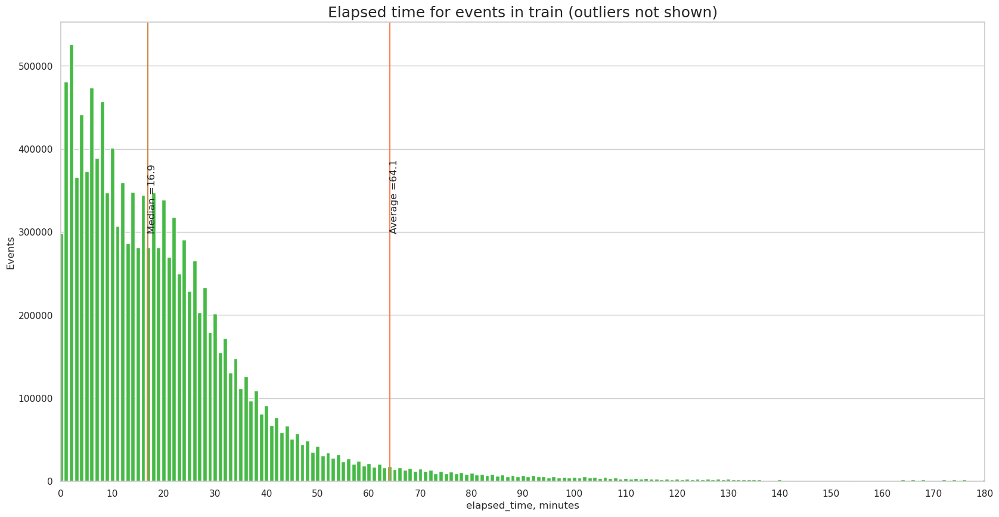

In [26]:
mean_elapsed_time_train = elapsed_time_train.mean()
median_elapsed_time_train = elapsed_time_train.median()
elapsed_time_train_counts = np.round(elapsed_time_train, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 10))
g = sns.barplot(x=elapsed_time_train_counts.index, y=elapsed_time_train_counts.values, color='limegreen')
plt.title('Elapsed time for events in train (outliers not shown)', fontsize=18)
g.set_xticklabels(['{}'.format(int(num)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='elapsed_time, minutes', ylabel='Events')
g.axvline(x=mean_elapsed_time_train, color="coral")
g.text(mean_elapsed_time_train, 300000, f'Average ={round(mean_elapsed_time_train, 1)}', rotation=90)
g.axvline(x=median_elapsed_time_train, color="peru")
g.text(median_elapsed_time_train, 300000, f'Median ={round(median_elapsed_time_train, 1)}', rotation=90)
del mean_elapsed_time_train, median_elapsed_time_train, elapsed_time_train_counts
plt.xlim(0, 180)
plt.show()

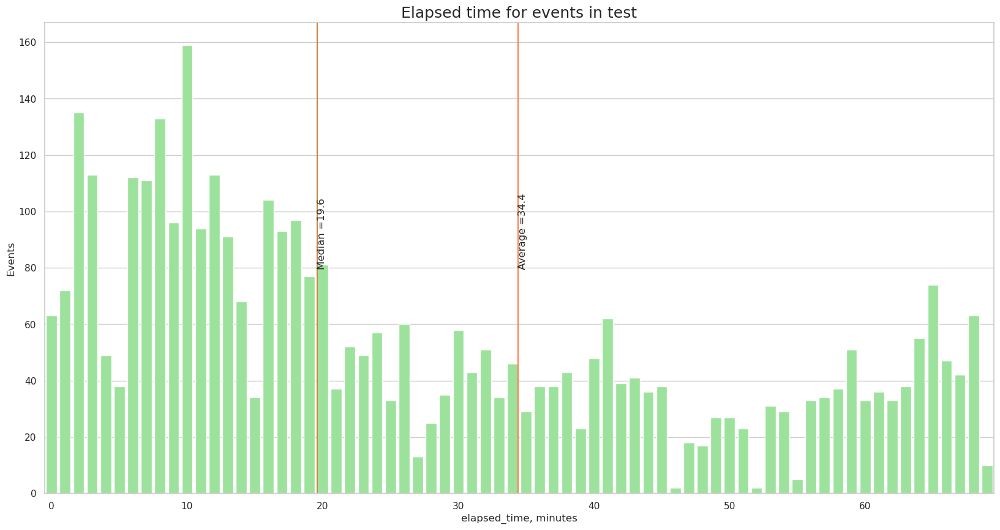

In [27]:
mean_elapsed_time_test = elapsed_time_test.mean()
median_elapsed_time_test = elapsed_time_test.median()
elapsed_time_test_counts  = np.round(elapsed_time_test, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 10))
g = sns.barplot(x=elapsed_time_test_counts.index, y=elapsed_time_test_counts.values, color='lightgreen')
plt.title('Elapsed time for events in test', fontsize=18)
g.set_xticklabels(['{}'.format(int(num)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='elapsed_time, minutes', ylabel='Events')
g.axvline(x=mean_elapsed_time_test, color="coral")
g.text(mean_elapsed_time_test, 80, f'Average ={round(mean_elapsed_time_test, 1)}', rotation=90)
g.axvline(x=median_elapsed_time_test, color="peru")
g.text(median_elapsed_time_test, 80, f'Median ={round(median_elapsed_time_test, 1)}', rotation=90)
del mean_elapsed_time_test, median_elapsed_time_test, elapsed_time_test_counts
plt.show()

Finally, we're also interested in the maximum `elapsed_time` for each session (i.e. when the game ended)

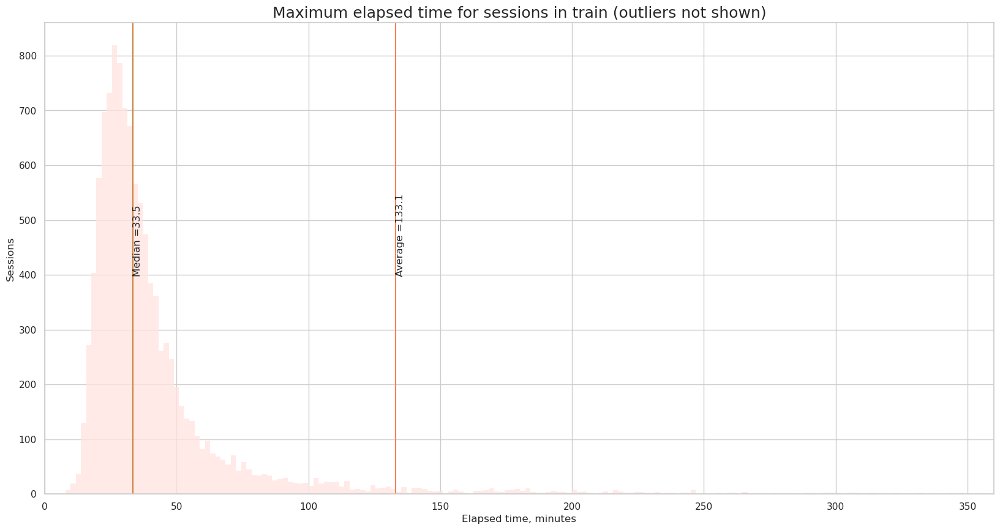

In [28]:
max_elapsed_time = train.groupby('session_id')['elapsed_time'].max()
max_elapsed_time = np.round(max_elapsed_time / 60000.0, 1)

mean_elapsed_time = max_elapsed_time.mean()
median_elapsed_time = max_elapsed_time.median()
plt.figure(figsize=(20, 10))
g = sns.histplot(max_elapsed_time, kde=False, color='mistyrose')
plt.title('Maximum elapsed time for sessions in train (outliers not shown)', fontsize=18)
plt.ticklabel_format(style='plain', axis='x')
g.set(xlabel='Elapsed time, minutes', ylabel='Sessions')
plt.axvline(x=mean_elapsed_time, color="coral")
plt.text(mean_elapsed_time, 400, f'Average ={round(mean_elapsed_time, 1)}', rotation=90)
plt.axvline(x=median_elapsed_time, color="peru")
plt.text(median_elapsed_time, 400, f'Median ={round(median_elapsed_time, 1)}', rotation=90)
plt.xlim(0, 360)
del max_elapsed_time, mean_elapsed_time, median_elapsed_time
plt.show()

### 2.4 event properties: name, type, and id <a class="anchor" id="event-properties"></a>

Let's now look at event properties:
- `event_name` is the event type (e.g. person click, cutscene click, object hover, etc)
- `name` is the event name (e.g. identifies whether a notebook_click is opening or closing the notebook)
- `fqid`: the fully qualified ID of the event (it refers to the person/object the player is interacting with)

In [29]:
event_names_counts_train = train['event_name'].value_counts()/1000
names_counts_train = train['name'].value_counts()/1000
fqid_counts_train = train['fqid'].value_counts()
event_names_counts_test = test['event_name'].value_counts()
names_counts_test = test['name'].value_counts()
fqid_counts_test = test['fqid'].value_counts()

print("Number of unique event names:", len(event_names_counts_train))
print("Number of unique names:", len(names_counts_train))
print("Number of unique fqid:", len(fqid_counts_train))

Number of unique event names: 11
Number of unique names: 6
Number of unique fqid: 127


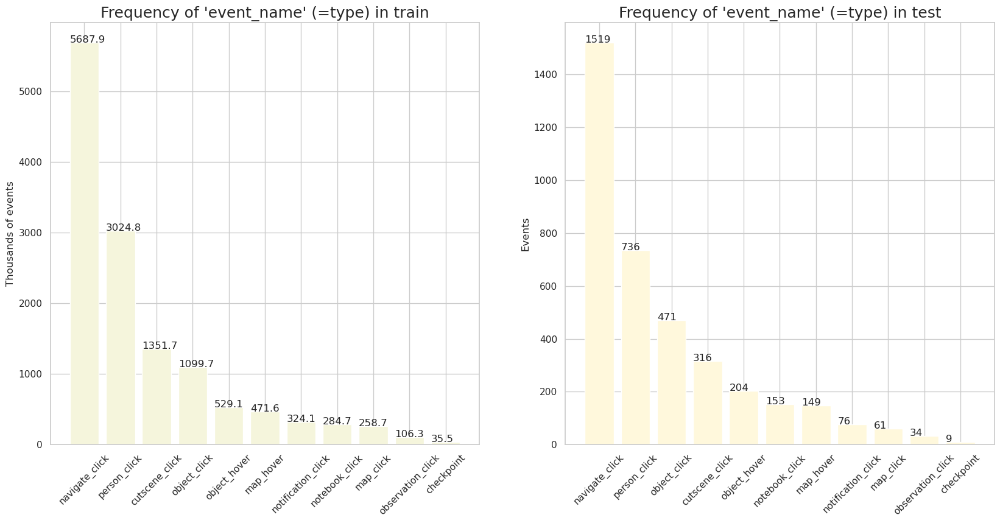

In [30]:
plt.figure(figsize=(20, 9))

plt.subplot(1, 2, 1)
plt.bar(event_names_counts_train.index, event_names_counts_train.values, color='beige')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of 'event_name' (=type) in train", fontsize=18)
for i, v in enumerate(event_names_counts_train.values):
    plt.text(i-0.4, v, str(round(v, 1)))
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
plt.bar(event_names_counts_test.index, event_names_counts_test.values, color='cornsilk')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of 'event_name' (=type) in test", fontsize=18)
for i, v in enumerate(event_names_counts_test.values):
    plt.text(i-0.4, v, str(int(v)))
plt.xticks(rotation=45)

del i, v
plt.show()


Meaning of the `event_name`:
- *navigate_click*: click on the place we want move protagonist (Jo) to move;
- *observation_click*: click on the black object that appears when you take your mouse pointer close to them;
- *notification_click*: after navigate click on an object like the notebook, the retirement letter - the click to hide or to continue after the text appears;
- *object_click*: click anywhere on the object pop up (only after notification_click)
- *object_hover*: the student takes the mouse pointer above an object;
- *map_hover*: the student takes the pointer above any place in the map;
- *map_click*: click on a place on the map to go there;
- *notebook_click*: click on notebook to look for notes made by Jo;
- *checkpoint*: the last event of a level-group/chapter in the data.

For additional details see [this kernel](https://www.kaggle.com/code/shashwatraman/meaning-of-each-event-name-and-eda).

In [31]:
event_name_session_counts = pd.DataFrame(train.groupby('event_name')['session_id'].value_counts())
event_name_session_counts.columns = ['count']
event_name_session_counts = event_name_session_counts.reset_index(drop=False)
print("'event_name' counts per session in train:")
event_name_session_counts.groupby('event_name')['count'].describe().drop(columns=['count']).style.format(precision=2).background_gradient(cmap='YlGn')

'event_name' counts per session in train:


,mean,std,min,25%,50%,75%,max
event_name,,,,,,,
checkpoint,3.01,0.19,2.00,3.00,3.00,3.00,8.00
cutscene_click,114.76,15.96,89.00,103.00,114.00,122.00,483.00
map_click,21.96,11.53,14.00,16.00,19.00,24.00,753.00
map_hover,43.49,27.43,5.00,27.00,36.00,51.00,472.00
navigate_click,482.88,260.72,162.00,331.00,419.00,555.00,11493.00
notebook_click,27.21,35.61,2.00,8.00,19.00,38.00,2605.00
notification_click,27.52,5.17,20.00,24.00,26.00,30.00,94.00
object_click,93.36,65.09,33.00,57.00,75.00,108.00,3045.00
object_hover,48.79,16.18,15.00,37.00,46.00,57.00,183.00


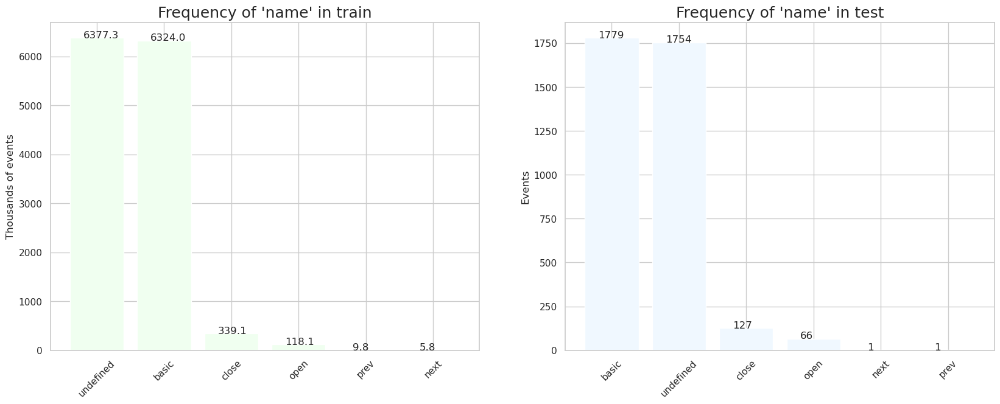

In [32]:
del event_name_session_counts
plt.figure(figsize=(20, 7))

plt.subplot(1, 2, 1)
plt.bar(names_counts_train.index, names_counts_train.values, color='honeydew')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of 'name' in train", fontsize=18)
for i, v in enumerate(names_counts_train.values):
    plt.text(i-0.2, v, str(round(v, 1)))
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
plt.bar(names_counts_test.index, names_counts_test.values, color='aliceblue')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of 'name' in test", fontsize=18)
for i, v in enumerate(names_counts_test.values):
    plt.text(i-0.2, v, str(int(v)))
plt.xticks(rotation=45)

del i, v
plt.show()

In [33]:
event_name_session_counts = pd.DataFrame(train.groupby(['event_name', 'name'])['session_id'].value_counts())
event_name_session_counts.columns = ['count']
event_name_session_counts = event_name_session_counts.reset_index(drop=False)
print("'event_name'/'name' counts per session in train:")
event_name_session_counts.groupby(['event_name', 'name'])['count'].describe().drop(columns=['count']).style.format(precision=2).background_gradient(cmap='YlGn')

'event_name'/'name' counts per session in train:


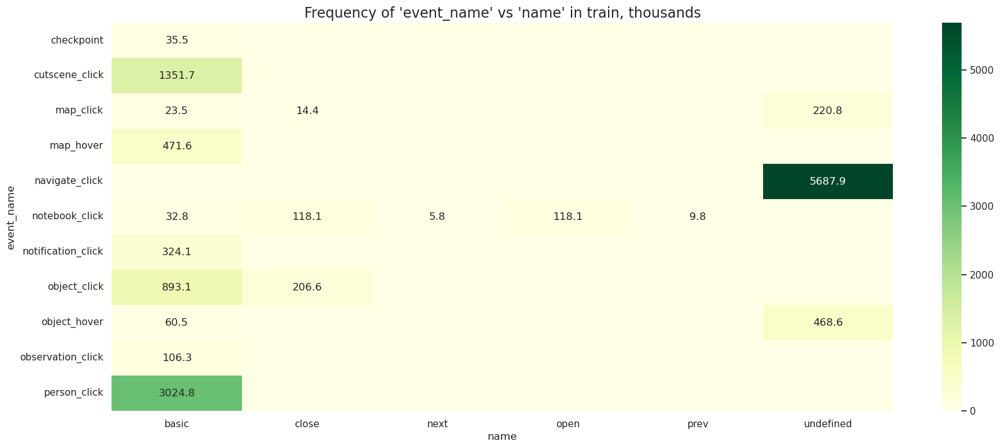

In [34]:
del event_name_session_counts
pivot = train.pivot_table(index='event_name', columns='name', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 8))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'event_name' vs 'name' in train, thousands", fontsize=16)
plt.show()

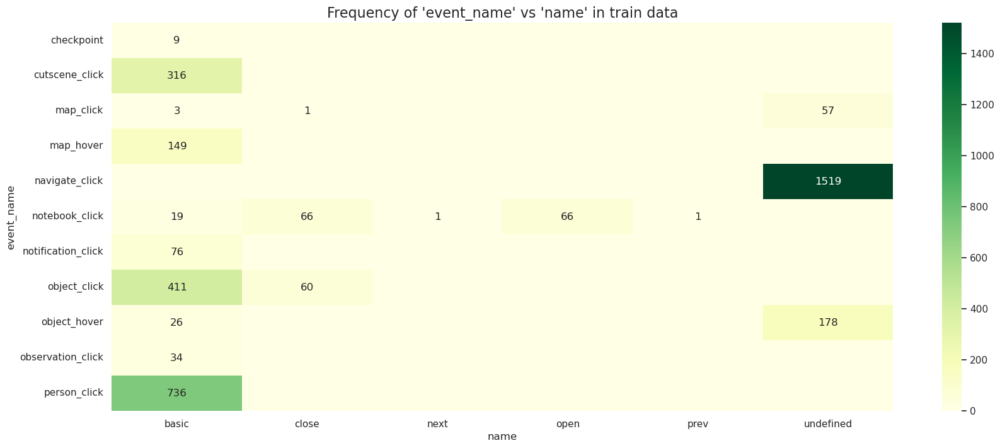

In [35]:
pivot = test.pivot_table(index='event_name', columns='name', aggfunc='size')
pivot = pivot.fillna(0).astype(int)
plt.figure(figsize=(20, 8))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'event_name' vs 'name' in train data", fontsize=16)
plt.show()
del g, pivot, annotations

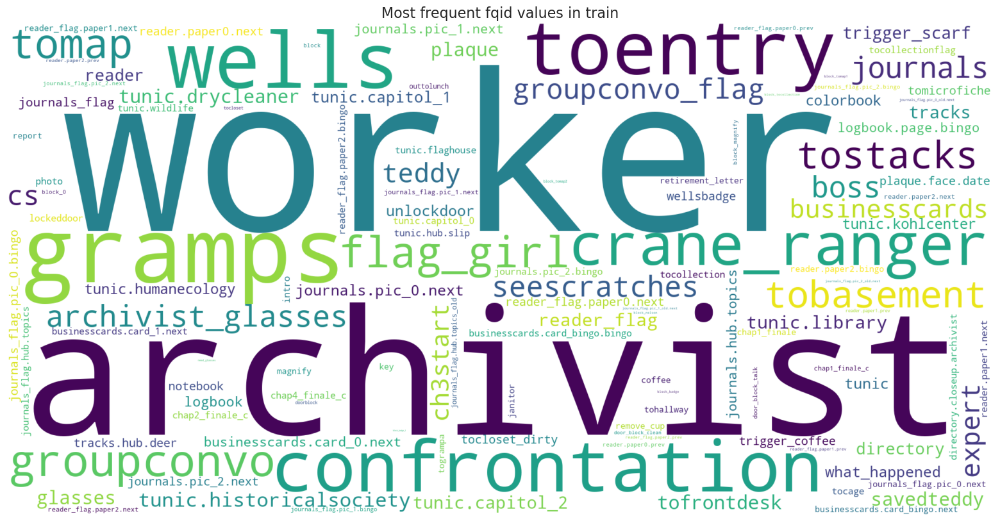

In [36]:
word_freq_train = dict(zip(fqid_counts_train.index.tolist(), fqid_counts_train.values.tolist()))
wordcloud_train = WordCloud(width=2000, height=1000, background_color="white").generate_from_frequencies(word_freq_train)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_train, interpolation='bilinear')
plt.title("Most frequent fqid values in train", fontsize=16)
plt.axis("off")
del word_freq_train, wordcloud_train
plt.show()

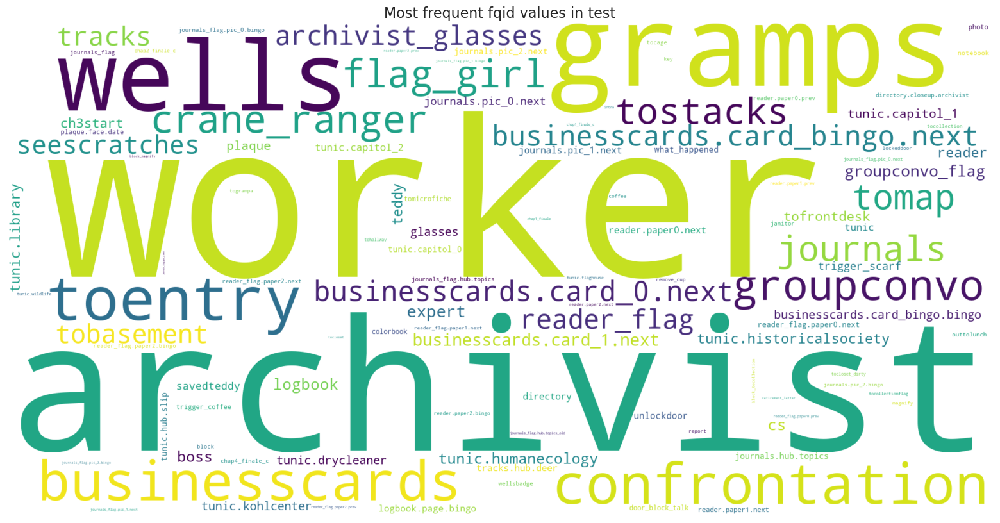

In [37]:
word_freq_test = dict(zip(fqid_counts_test.index.tolist(), fqid_counts_test.values.tolist()))
wordcloud_test = WordCloud(width=2000, height=1000, background_color="white").generate_from_frequencies(word_freq_test)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_test, interpolation='bilinear')
plt.title("Most frequent fqid values in test", fontsize=16)
plt.axis("off")
del word_freq_test, wordcloud_test
plt.show()

In [38]:
print('TOP-10 fqid for events:')
stat = pd.DataFrame([fqid_counts_train, fqid_counts_test]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
del event_names_counts_train, names_counts_train, fqid_counts_train, event_names_counts_test, names_counts_test, fqid_counts_test
stat.head(10).style.format(precision=0)

TOP-10 fqid for events:


,train,test
worker,939555,214
archivist,563259,148
gramps,561000,144
wells,394234,102
toentry,392221,94
confrontation,348723,78
crane_ranger,251943,54
groupconvo,227881,55
flag_girl,224758,53
tomap,202176,44


## 2.5. game room <a class="anchor" id="game-room"></a>

`room_fqid` is the ID of the room the event took place in. The player progresses through the game by moving from one room to another.

In [39]:
room_counts_train = train['room_fqid'].value_counts()/1000
room_counts_test = test['room_fqid'].value_counts()

print("Number of unique rooms:", len(room_counts_train))

Number of unique rooms: 19


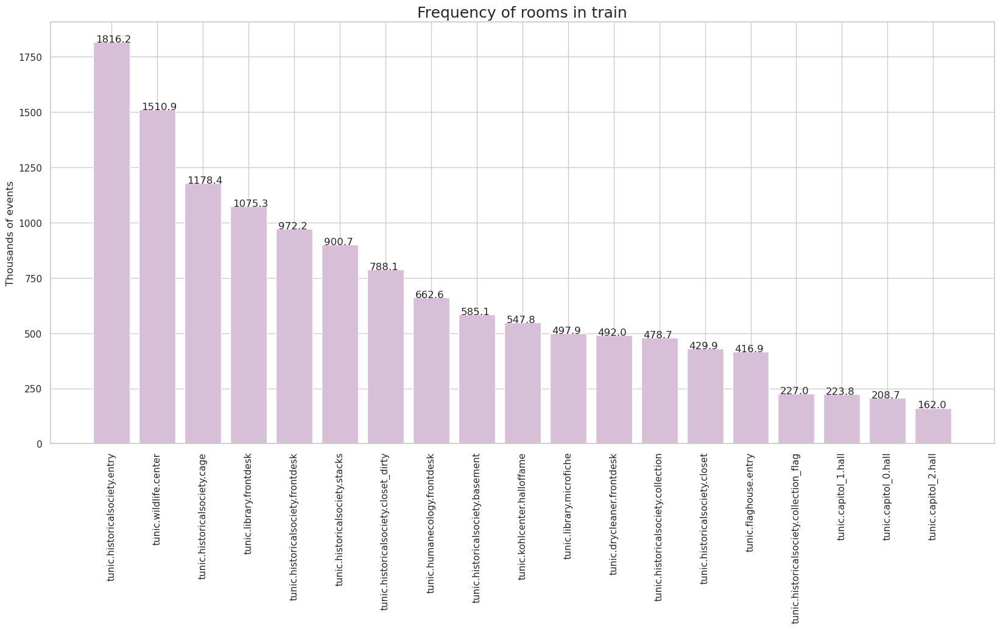

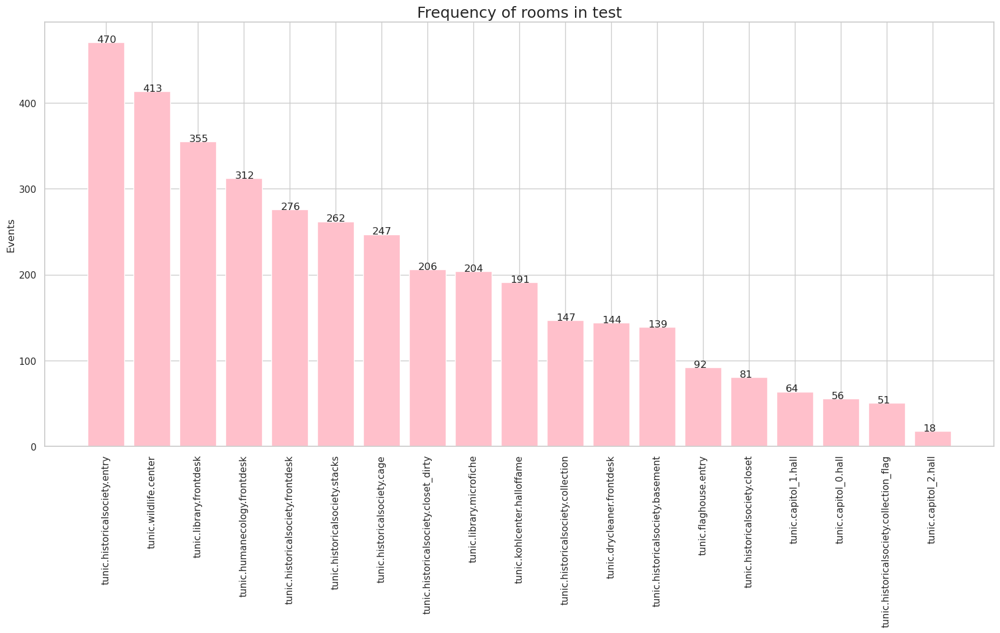

In [40]:
plt.figure(figsize=(20, 9))
plt.bar(room_counts_train.index, room_counts_train.values, color='thistle')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of rooms in train", fontsize=18)
for i, v in enumerate(room_counts_train.values):
    plt.text(i-0.35, v, str(round(v, 1)))
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(20, 9))
plt.bar(room_counts_test.index, room_counts_test.values, color='pink')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of rooms in test", fontsize=18)
for i, v in enumerate(room_counts_test.values):
    plt.text(i-0.2, v, str(int(v)))
plt.xticks(rotation=90)

del i, v
plt.show()

### 2.6 level and level_group <a class="anchor" id="level"></a>

- `level` is what level of the game the event occurred in (0 to 22).
- `level_group`: which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)

The number of questions in each level_group is fixed:

| `level_group` | questions | number of questions|
|:---:|:--:|:--:|
| 0-4 |  q1 to q3 |3|
| 5-12 | q4 to q13 |10|
| 13-22 | q14 to q18 |5|

At levels 4, 12, 22 the game has *checkpoint* events when questions are being asked.

Note that there are sessions in which one of the 22 levels is not present. Most likely this is due to data record issues:

In [41]:
unique_levels_per_session = train[['session_id', 'level']].drop_duplicates()
missing_sessions = unique_levels_per_session.groupby('session_id').count().reset_index(drop=False)
missing_sessions = missing_sessions[missing_sessions['level'] != 23].reset_index(drop=True)['session_id']
print(f"Number of sessions in which one of the 22 levels is not present: {len(missing_sessions)}")
for lvl in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]:
    x = unique_levels_per_session.loc[(unique_levels_per_session['session_id'].isin(missing_sessions)) & (unique_levels_per_session['level'].eq(lvl))]
    if len(x) != len(missing_sessions):
        print(f"\nLevel {lvl} is missing in {len(x)} sessions")
        print(f"Examples of sessions with missing {lvl} level:", x['session_id'].to_list()[:5])
del lvl, x, unique_levels_per_session, missing_sessions

level_counts_train = train['level'].value_counts()/1000
level_group_counts_train = train['level_group'].value_counts()/1000
level_counts_test = test['level'].value_counts()
level_group_counts_test = test['level_group'].value_counts()

Number of sessions in which one of the 22 levels is not present: 288

Level 7 is missing in 287 sessions
Examples of sessions with missing 7 level: [20100018421509572, 20100115005512812, 20100115142089760, 20100118090535520, 20100211432649536]

Level 15 is missing in 5 sessions
Examples of sessions with missing 15 level: [20100309472366890, 21010516063465684, 21050517310296616, 22030509455473956, 22070312074481360]

Level 20 is missing in 283 sessions
Examples of sessions with missing 20 level: [20100018421509572, 20100115005512812, 20100115142089760, 20100118090535520, 20100211432649536]

Level 21 is missing in 286 sessions
Examples of sessions with missing 21 level: [20100018421509572, 20100115005512812, 20100115142089760, 20100118090535520, 20100211432649536]


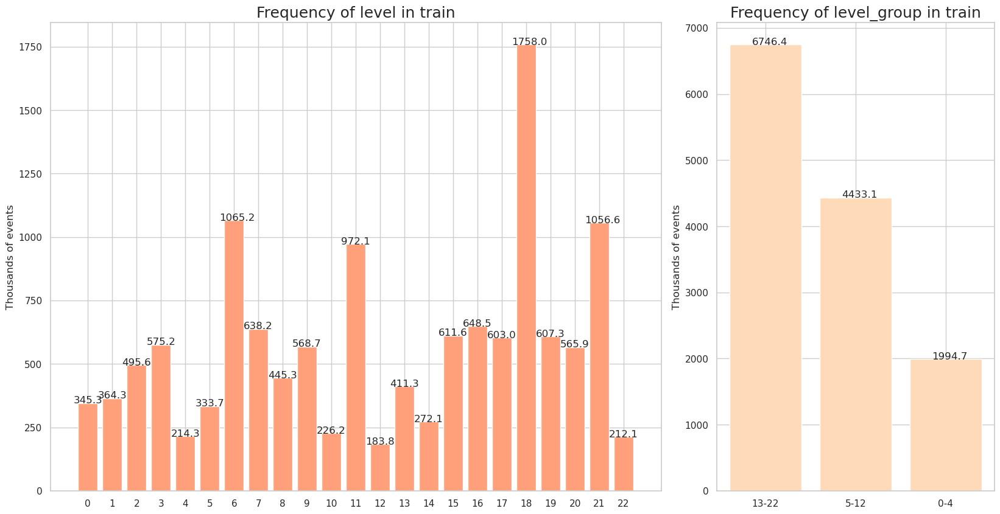

In [42]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, (1, 2))
plt.bar(level_counts_train.index, level_counts_train.values, color='lightsalmon')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of level in train", fontsize=18)
for i, v in enumerate(level_counts_train.sort_index().values):
    plt.text(i-0.6, v, str(round(v, 1)))
plt.xticks(level_counts_train.index)

plt.subplot(1, 3, 3)
plt.bar(level_group_counts_train.index, level_group_counts_train.values, color='peachpuff')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of level_group in train", fontsize=18)
for i, v in enumerate(level_group_counts_train):
    plt.text(i-0.15, v, str(round(v, 1)))
plt.xticks()
plt.show()

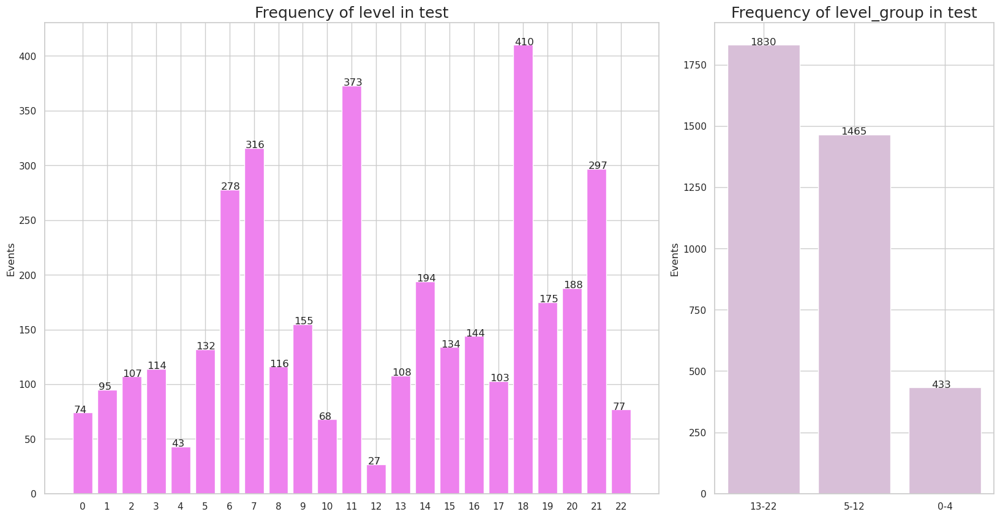

In [43]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, (1, 2))
plt.bar(level_counts_test.index, level_counts_test.values, color='violet')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of level in test", fontsize=18)
for i, v in enumerate(level_counts_test.sort_index().values):
    plt.text(i-0.35, v, str(int(v)))
plt.xticks(level_counts_train.index)

plt.subplot(1, 3, 3)
plt.bar(level_group_counts_test.index, level_group_counts_test.values, color='thistle')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of level_group in test", fontsize=18)
for i, v in enumerate(level_group_counts_test):
    plt.text(i-0.15, v, str(int(v)))
plt.xticks()
plt.show()

Let's also look at intersections with some other variables:

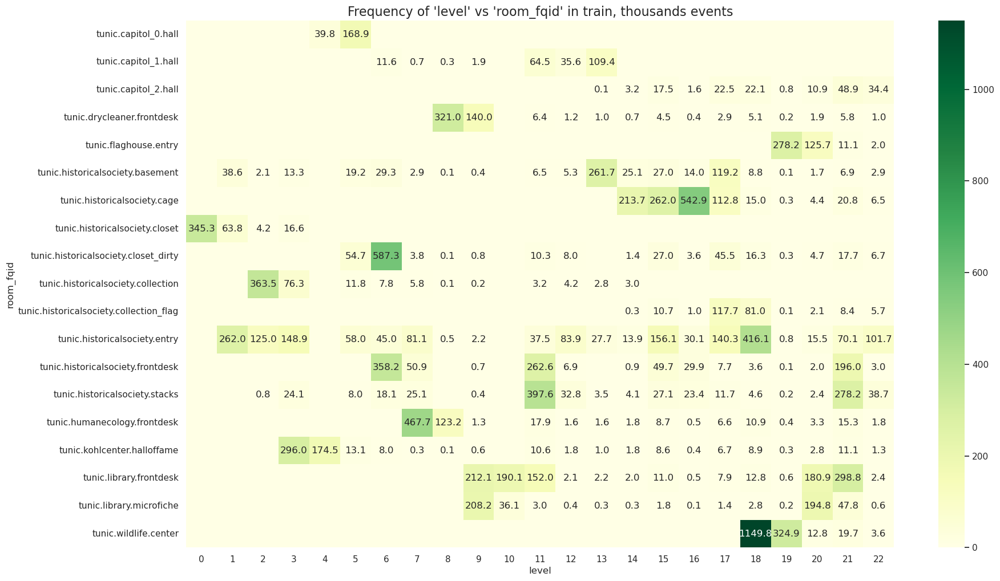

In [44]:
pivot = train.pivot_table(index='room_fqid', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 12))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'room_fqid' in train, thousands events", fontsize=16)
plt.show()

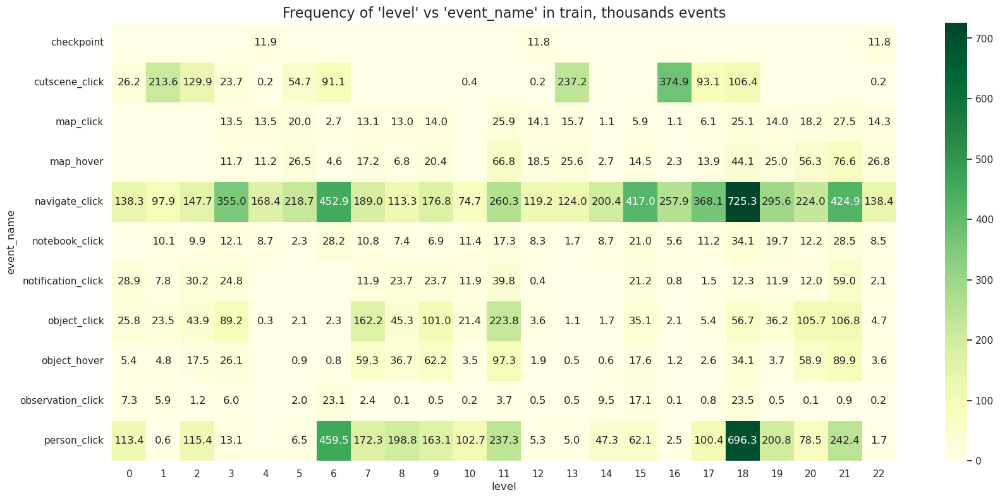

In [45]:
pivot = train.pivot_table(index='event_name', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 9))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'event_name' in train, thousands events", fontsize=16)
plt.show()

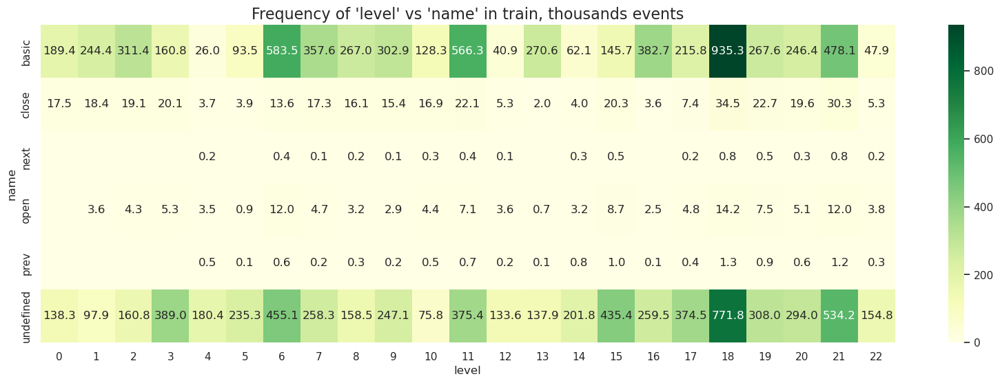

In [46]:
pivot = train.pivot_table(index='name', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 6))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'name' in train, thousands events", fontsize=16)
plt.show()

## 2.7 click geo-location <a class="anchor" id="click-geo-location"></a>

There are four geo-location variables in the data:
- `room_coor_x`: the coordinates of the click in reference to the in-game room (only for click events)
- `room_coor_y`: the coordinates of the click in reference to the in-game room (only for click events)
- `screen_coor_x`: the coordinates of the click in reference to the player’s screen (only for click events)
- `screen_coor_y`: the coordinates of the click in reference to the player’s screen (only for click events)

About 90-92% of all events are the click events:

In [47]:
print(f"Share of events with geo-location in train: {round(train['room_coor_x'].count() / len(train)*100, 2)}")
print(f"Share of events with geo-location in test: {round(test['room_coor_x'].count() / len(test)*100, 2)}")

Share of events with geo-location in train: 92.13
Share of events with geo-location in test: 90.29


In [48]:
stat = pd.DataFrame([train['room_coor_x'].describe().index.to_list(),
                    train['room_coor_x'].astype('float64').describe().values,
                    train['room_coor_y'].astype('float64').describe().values,
                    train['screen_coor_x'].astype('float64').describe().values,
                    train['screen_coor_y'].astype('float64').describe().values,
                    test['room_coor_x'].astype('float64').describe().values,
                    test['room_coor_y'].astype('float64').describe().values,
                    test['screen_coor_x'].astype('float64').describe().values,
                    test['screen_coor_y'].astype('float64').describe().values]).T
stat.columns = [' ', 'room_coor_x in train', 'room_coor_y in train', 'screen_coor_x in train', 'screen_coor_y in train',
                     'room_coor_x in test', 'room_coor_y in test', 'screen_coor_x in test', 'screen_coor_y in test']
stat[stat.columns.to_list()[1:]] = stat[stat.columns.to_list()[1:]].apply(pd.to_numeric, errors='coerce' )
print('Geo-location statistics for events:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Geo-location statistics for events:


,room_coor_x in train,room_coor_y in train,screen_coor_x in train,screen_coor_y in train,room_coor_x in test,room_coor_y in test,screen_coor_x in test,screen_coor_y in test
mean,-54.9,-116.3,458.1,385.2,-14.7,-131.1,463.7,394.4
std,520.1,218.6,247.2,129.3,511.1,224.0,243.7,133.5
min,-1992.0,-918.0,0.0,0.0,-1913.0,-908.5,0.0,10.0
25%,-353.0,-212.9,269.0,304.0,-290.1,-232.8,278.2,320.2
50%,-11.2,-97.8,447.0,397.0,16.8,-109.0,460.0,408.0
75%,296.2,22.7,663.0,471.0,355.0,1.0,680.0,486.0
max,1262.0,543.5,1916.0,1439.0,1215.0,489.5,879.0,658.0


However, general coordinates statistics make little or no sense. We need click density for each specific room:

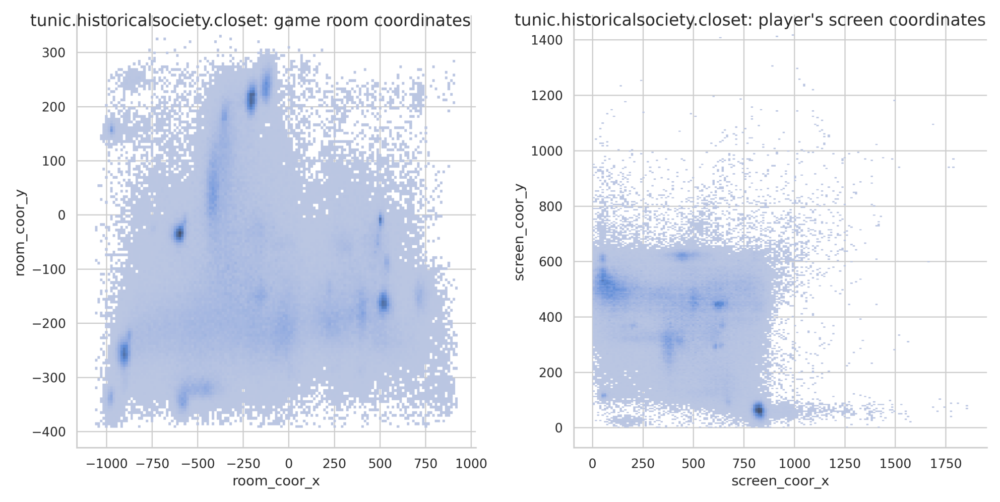

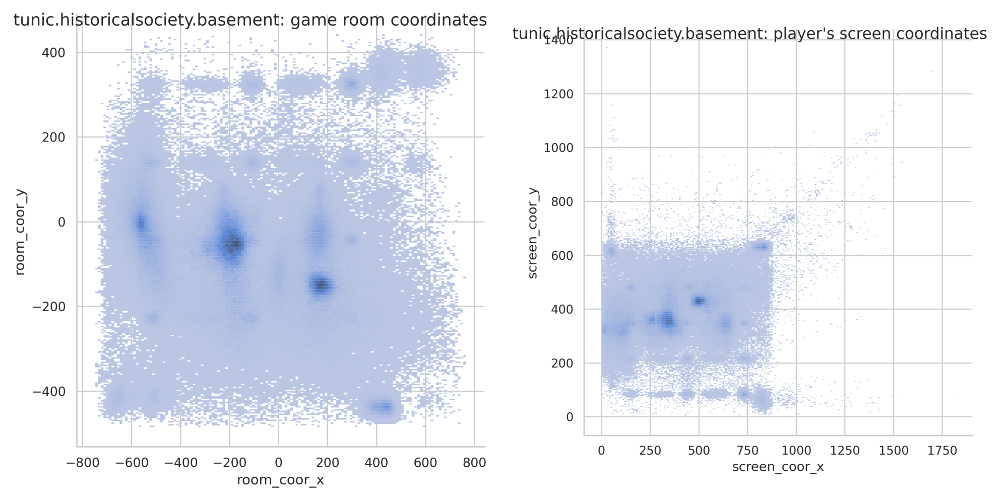

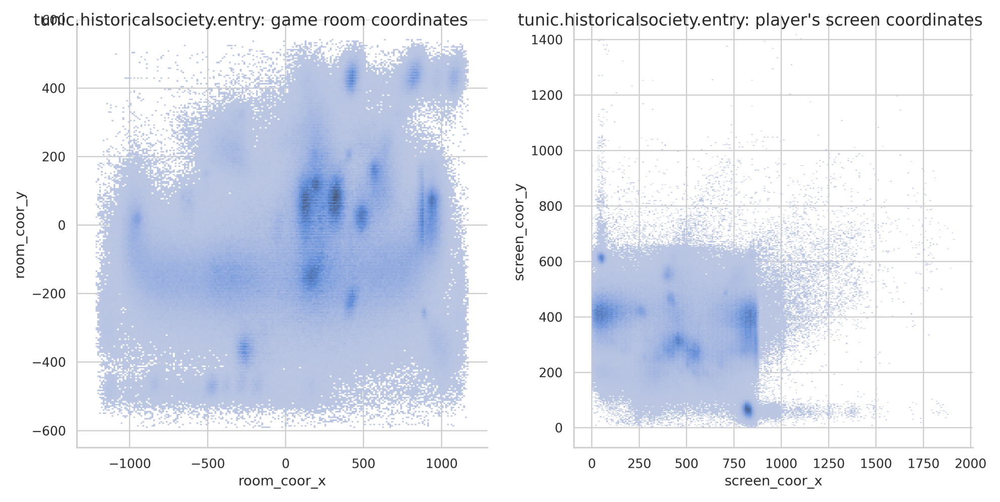

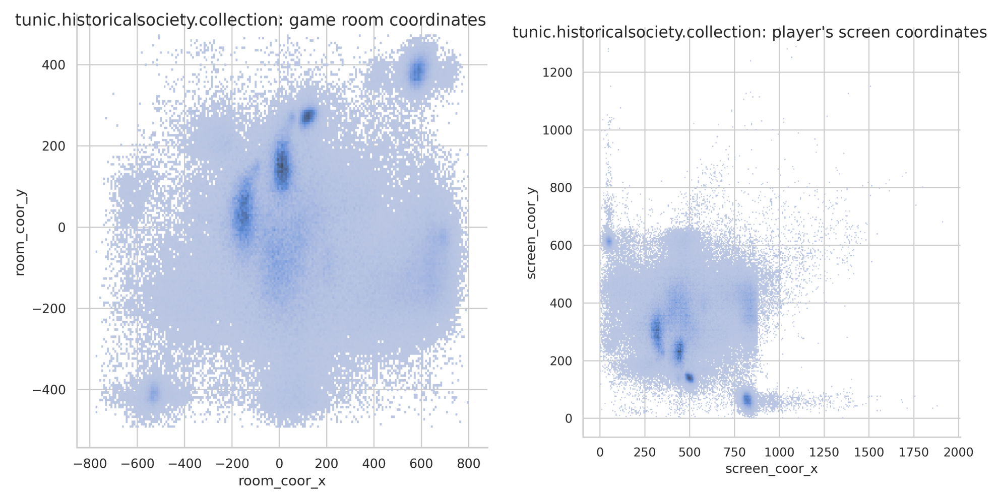

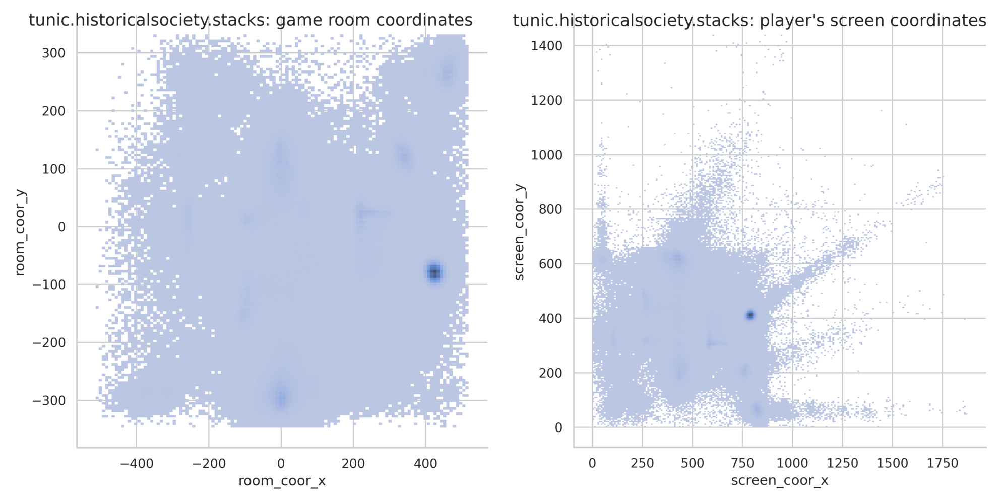

...

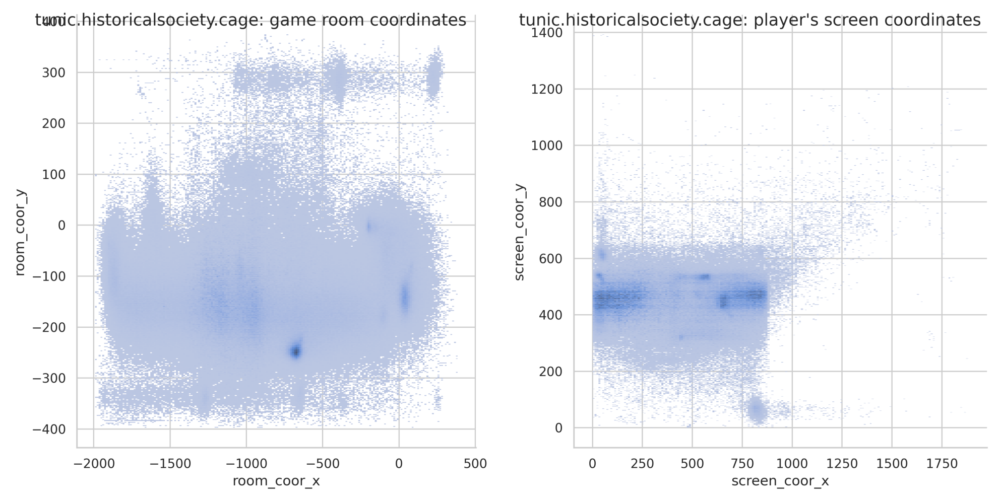

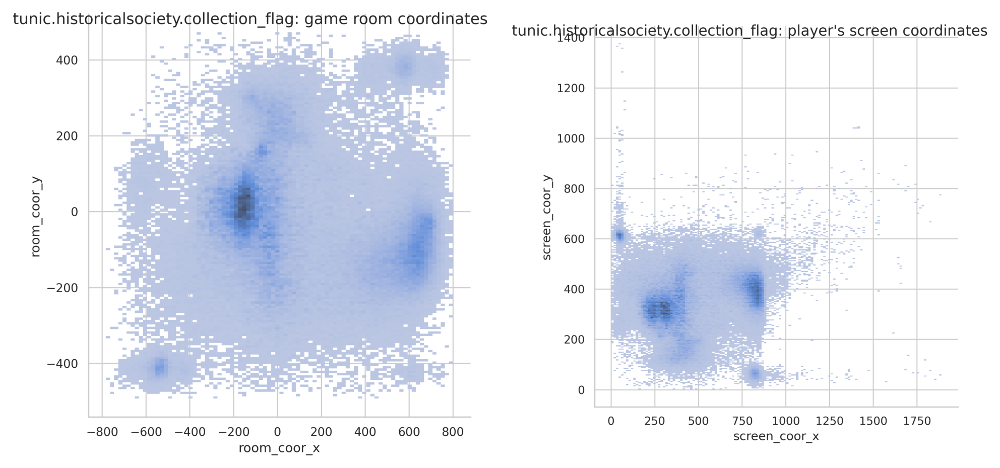

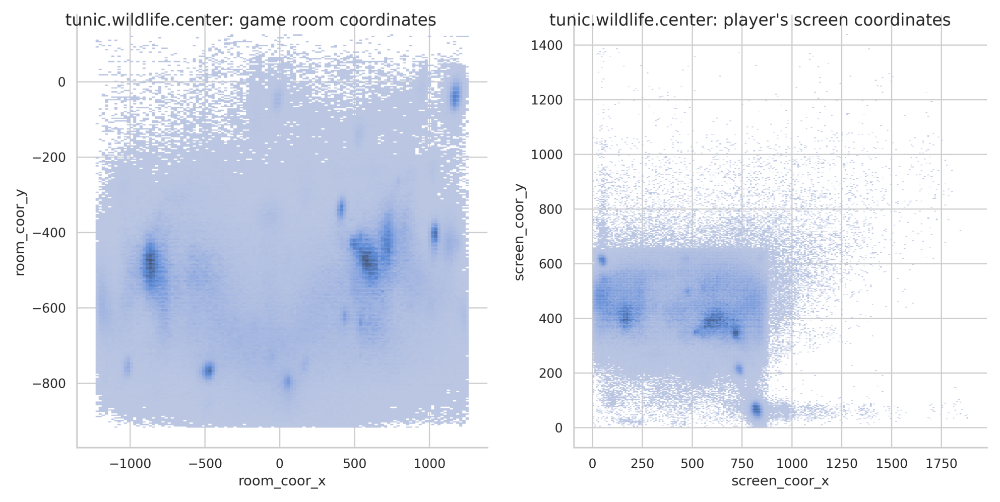

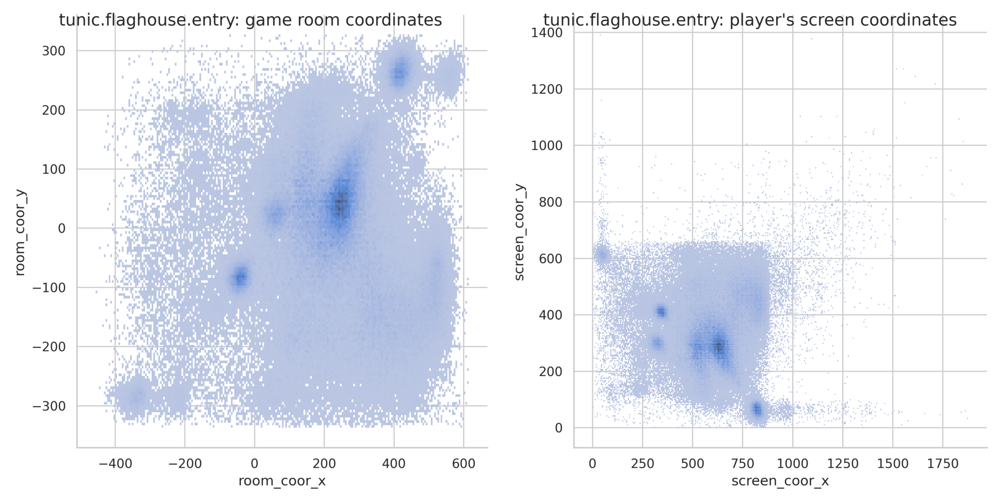

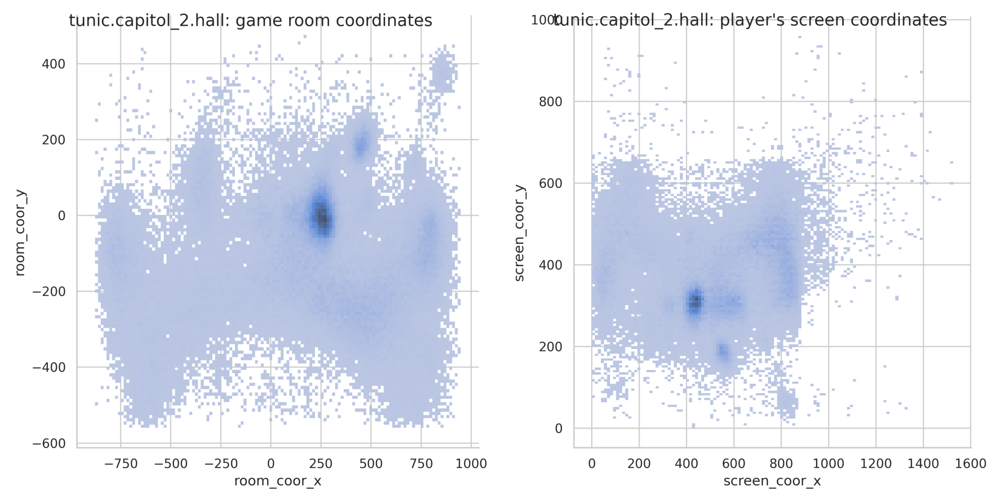

In [49]:
rooms = train['room_fqid'].unique().to_list()
for room in rooms:
    data_room = train[train['room_fqid'] == room]
    data_room = data_room[['room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y']].dropna().reset_index(drop=True)
    data_room = data_room.apply(pd.to_numeric, errors='coerce')
    g = sns.pairplot(
        data=data_room,
        x_vars=["room_coor_x"],
        y_vars=["room_coor_y"],
        kind='hist',
        height=6
    )
    g.fig.suptitle(f"{room}: game room coordinates")
    g.savefig('g0.png', dpi=300)
    plt.close(g.fig)
    
    g = sns.pairplot(
        data=data_room,
        x_vars=["screen_coor_x"],
        y_vars=["screen_coor_y"],
        kind='hist',
        height=6
    )
    g.fig.suptitle(f"{room}: player's screen coordinates")
    g.savefig('g1.png', dpi=300)
    plt.close(g.fig)
    
    f, ax = plt.subplots(1, 2, figsize=(20, 20))
    ax[0].imshow(mpimg.imread('g0.png'))
    ax[1].imshow(mpimg.imread('g1.png'))
    [axarr.set_axis_off() for axarr in ax.ravel()]
    plt.tight_layout()
    plt.show()

del room, rooms, data_room, g, f, ax

A high density of clicks shows the locations of important objects or characters. Now let's review the geo-location path for a randomly selected session:

In [50]:
def plot_geo_location(df, session_id):
    session_df = df[df['session_id'] == session_id]
    rooms = session_df['room_fqid'].unique().to_list()
    for room in rooms:
        session_df_room = session_df[session_df['room_fqid'] == room]
        session_df_room = session_df_room[['room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y']].dropna().reset_index(drop=True)        
        plt.figure(figsize=(15, 6))        
        
        # room
        x = session_df_room['room_coor_x']
        y = session_df_room['room_coor_y']
        plt.subplot(1, 5, (1, 3))
        plt.plot(x, y, zorder=0, lw=0.5, color='steelblue')
        plt.scatter(x, y, s=5, color='grey')
        plt.scatter(x[0], y[0], s=200, lw=5, color='gold', marker='*')
        plt.scatter(x[-1:], y[-1:], s=200, lw=5, color='crimson', marker='*')
        plt.title(f"{session_id}: {room} (room)")
        plt.legend(['Cursor path', 'Click position', 'Start', 'End'])
        plt.gca().set_aspect('equal', adjustable='box')
        plt.xlim(-2000, 1300)
        plt.ylim(-920, 550)
        plt.xlabel("room_coor_x")
        plt.ylabel("room_coor_y")      
    
        # screen
        x = session_df_room['screen_coor_x']
        y = session_df_room['screen_coor_y']
        plt.subplot(1, 5, (4, 5))
        plt.plot(x, y, zorder=0, lw=0.5, color='lightcoral')
        plt.scatter(x, y, s=5, color='grey')
        plt.scatter(x[0], y[0], s=200, lw=5, color='gold', marker='*')
        plt.scatter(x[-1:], y[-1:], s=200, lw=5, color='crimson', marker='*')
        plt.title(f"session {session_id}: {room} (screen)")
        plt.legend(['Cursor path', 'Click position', 'Start', 'End'])
        plt.gca().set_aspect('equal', adjustable='box')
        plt.xlabel("screen_coor_x")
        plt.ylabel("screen_coor_y")
        plt.xlim(0, 2000)
        plt.ylim(0, 1500)
        plt.tight_layout()
        plt.show()

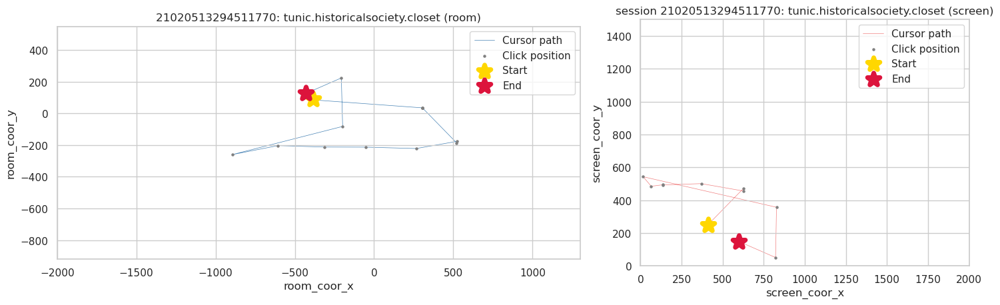

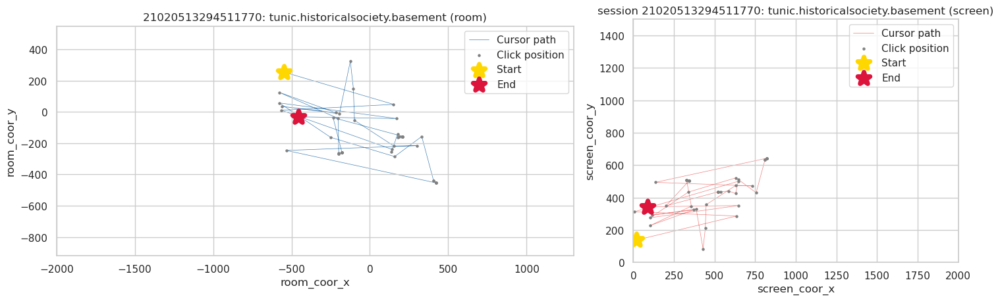

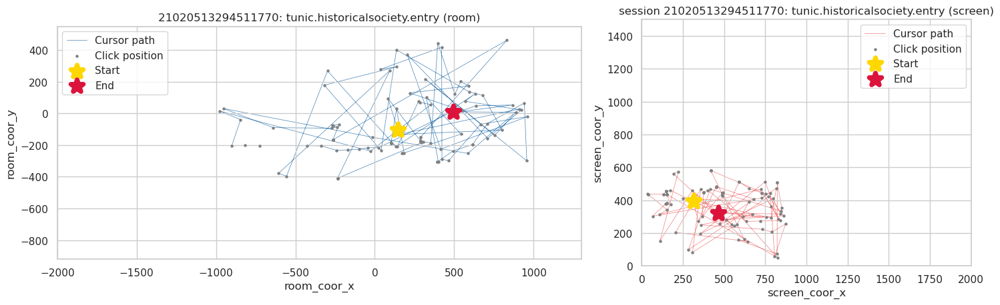

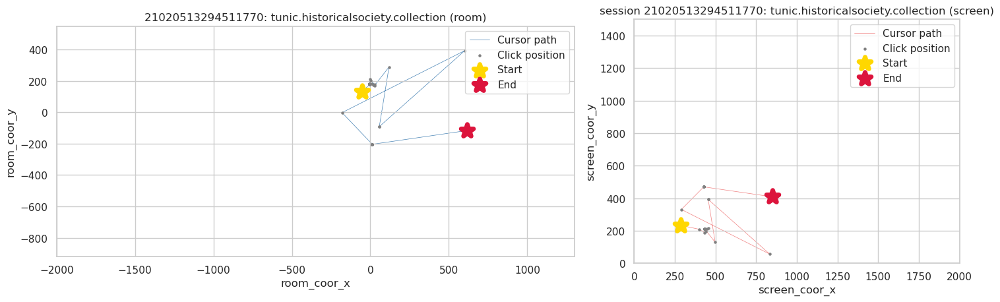

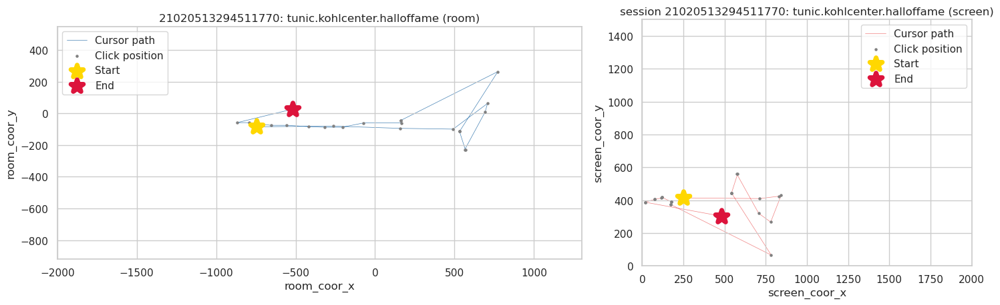

...

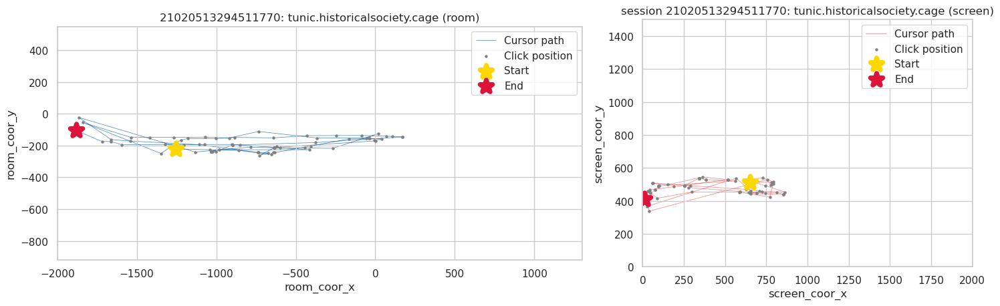

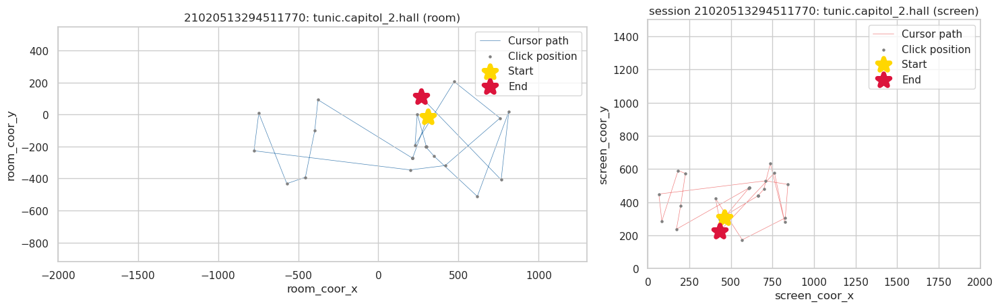

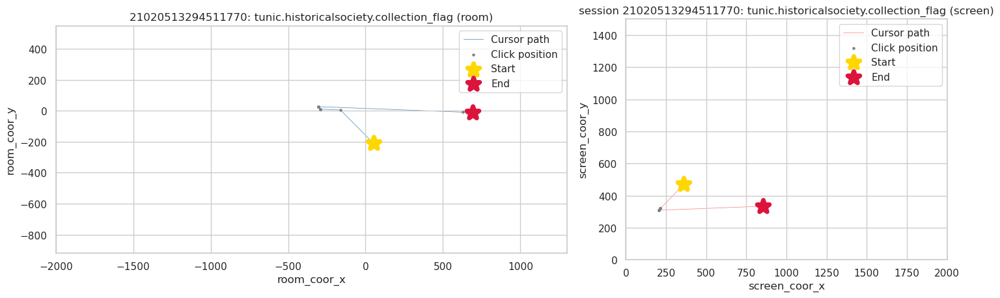

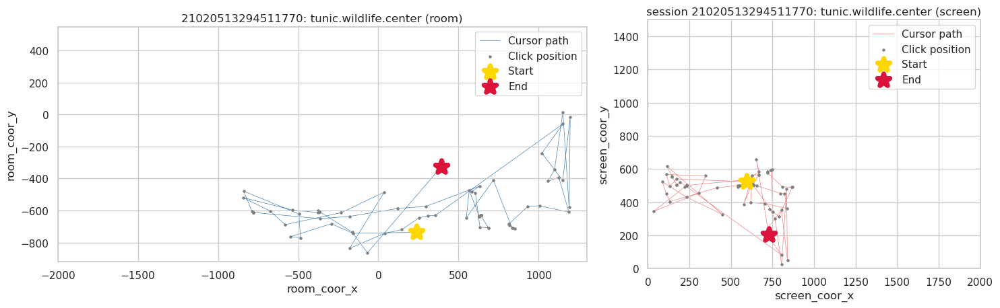

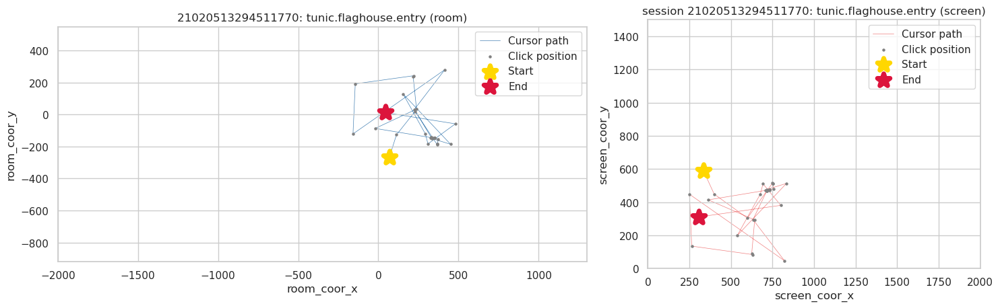

In [51]:
idx_dupl = train[['session_id', 'index']]
idx_dupl = idx_dupl[idx_dupl.duplicated()]
session_ids = train['session_id'].unique()
session_ids = session_ids[np.isin(session_ids, idx_dupl['session_id'].unique(), invert=True)]
plot_geo_location(train, np.random.choice(session_ids))
del session_ids, idx_dupl

For additional details on click flow see insightful [discussion](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/387864) and [notebook](https://www.kaggle.com/code/cdeotte/game-room-click-eda) by Chris Deotte.

In addition, [this notebook](https://www.kaggle.com/code/vassylkorzh/play-game-session?scriptVersionId=119784646) has an interactive view on clicks: it allows you to select a session and watch the session click events at each stage of the game.

## 2.8 text <a class="anchor" id="text"></a>

There are two text variables:
- `text`: the text the player sees during this event  (some in hex format, e.g. \u00f0\u0178\u02dc\u0090)
- `text_fqid`: the fully qualified ID of the text

In [52]:
print(f"Number of unique text messages in train: {len(train['text'].unique())}")
print(f"Number of unique text messages in test: {len(test['text'].unique())}")

Number of unique text messages in train: 595
Number of unique text messages in test: 496


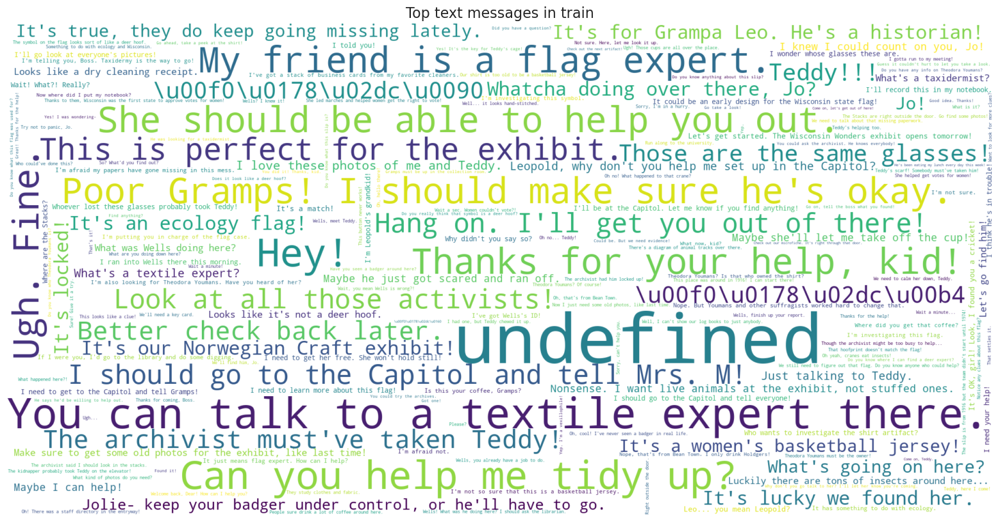

In [53]:
text_counts_train = test['text'].value_counts()
word_freq_train = dict(zip(text_counts_train.index.tolist(), text_counts_train.values.tolist()))
wordcloud_train = WordCloud(width=2000, height=1000, background_color="white").generate_from_frequencies(word_freq_train)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_train, interpolation='bilinear')
plt.title("Top text messages in train", fontsize=16)
plt.axis("off")
del word_freq_train, wordcloud_train, text_counts_train
plt.show()

In [54]:
print(f"TOP-20 text messages:")
stat = pd.DataFrame([train['text'].value_counts(), test['text'].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(20).style.format(precision=0)

TOP-20 text messages:


,train,test
undefined,178294,27
\u00f0\u0178\u02dc\u0090,24383,4
Hey!,23724,6
I should go to the Capitol and tell Mrs. M!,20074,4
This is perfect for the exhibit.,19987,4
Look at all those activists!,19985,4
"If I were you, I'd go to the library and do some digging.",19478,3
Ugh. Fine.,17991,5
\u00f0\u0178\u02dc\u00b4,17827,4
You can talk to a textile expert there.,17632,7


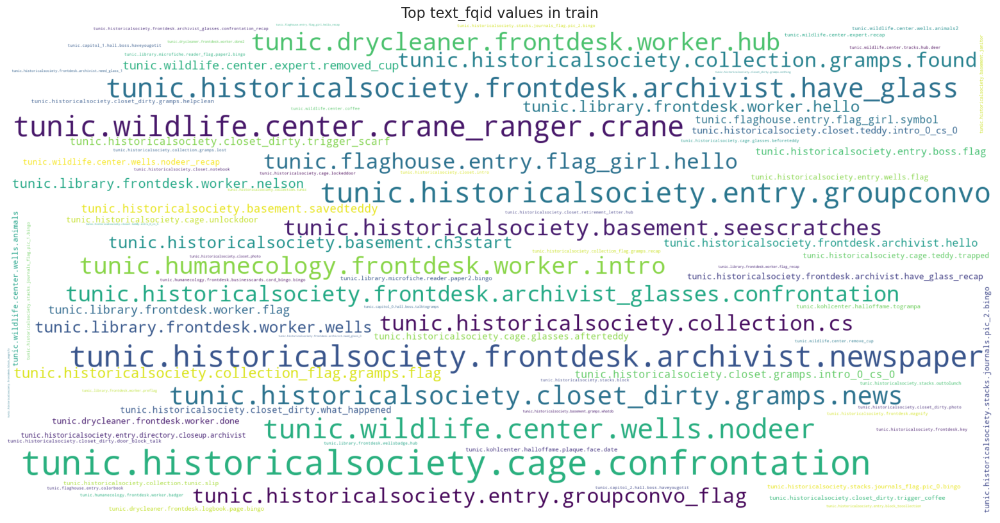

In [55]:
text_counts_train = test['text_fqid'].value_counts()
word_freq_train = dict(zip(text_counts_train.index.tolist(), text_counts_train.values.tolist()))
wordcloud_train = WordCloud(width=2000, height=1000, background_color="white").generate_from_frequencies(word_freq_train)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_train, interpolation='bilinear')
plt.title("Top text_fqid values in train", fontsize=16)
plt.axis("off")
del word_freq_train, wordcloud_train, text_counts_train
plt.show()

In [56]:
print(f"TOP-20 text_fqid messages:")
stat = pd.DataFrame([train['text_fqid'].value_counts(), test['text_fqid'].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(20).style.format(precision=0)

TOP-20 text_fqid messages:


,train,test
tunic.historicalsociety.cage.confrontation,333363,75
tunic.wildlife.center.crane_ranger.crane,235368,51
tunic.historicalsociety.frontdesk.archivist.newspaper,214637,54
tunic.historicalsociety.entry.groupconvo,213592,51
tunic.wildlife.center.wells.nodeer,199978,49
tunic.historicalsociety.frontdesk.archivist.have_glass,197249,48
tunic.drycleaner.frontdesk.worker.hub,181269,39
tunic.historicalsociety.closet_dirty.gramps.news,167085,42
tunic.humanecology.frontdesk.worker.intro,149849,37
tunic.historicalsociety.frontdesk.archivist_glasses.confrontation,131629,31


Note that `text_fqid` and `text` are not the same feature:
- `text_fqid` is the text group;
- `text` is specific text shown to player;

In [57]:
print(f"TOP-30 text_fqid and text combinations:")
stat = pd.DataFrame([train[['text_fqid', 'text']].value_counts(), test[['text_fqid', 'text']].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(30).style.format(precision=0)

TOP-30 text_fqid and text combinations:


Furthermore, `text_fqid` includes two elements: `room_fqid` (game room) and `fqid` (person/object the player is interacting with). Examples:

In [58]:
train[['room_fqid', 'fqid', 'text_fqid']].dropna().drop_duplicates().head().style.hide_index()

room_fqid,fqid,text_fqid
tunic.historicalsociety.closet,intro,tunic.historicalsociety.closet.intro
tunic.historicalsociety.closet,gramps,tunic.historicalsociety.closet.gramps.intro_0_cs_0
tunic.historicalsociety.closet,teddy,tunic.historicalsociety.closet.teddy.intro_0_cs_0
tunic.historicalsociety.closet,teddy,tunic.historicalsociety.closet.teddy.intro_0_cs_5
tunic.historicalsociety.closet,photo,tunic.historicalsociety.closet.photo


## 2.9 page <a class="anchor" id="page"></a>

`page` is the page number of the event (only for notebook-related events). Share of notebook-related events is small:

In [59]:
print(f"Share of events with page in train: {round(train['page'].count() / len(train)*100, 2)}%")
print(f"Share of events with page in test: {round(test['page'].count() / len(test)*100, 2)}%")

page_counts_train = train['page'].value_counts()/1000
page_counts_test = test['page'].value_counts()

Share of events with page in train: 2.16%
Share of events with page in test: 4.1%


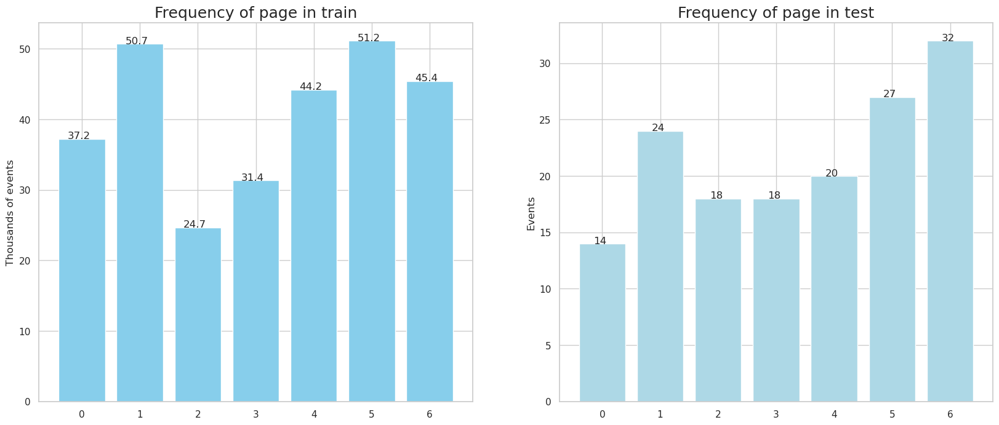

In [60]:
plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.bar(page_counts_train.index, page_counts_train.values, color='skyblue')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of page in train", fontsize=18)
for i, v in enumerate(page_counts_train.sort_index().values):
    plt.text(i-0.25, v, str(round(v, 1)))
plt.xticks()

plt.subplot(1, 2, 2)
plt.bar(page_counts_test.index, page_counts_test.values, color='lightblue')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of page in test", fontsize=18)
for i, v in enumerate(page_counts_test.sort_index().values):
    plt.text(i-0.15, v, str(int(v)))
plt.xticks()
plt.show()

## 2.10 hover <a class="anchor" id="hover"></a>

`hover_duration`: how long (in milliseconds) the hover happened for (only for hover events). There are [two types](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/391043#2162552) of hover events:

>*Object_Hover* - In each chapter of the game, some tasks have to be performed by the student, like clicking the slip on the t-shirt in the 1st Chapter of the game. This slip is an object. If the student takes the mouse pointer above this object, an object_hover is recorded.
The duration for which the pointer stays above this object, is recorded in the `hover_duration`.
If he/she clicks on the object, it's an `object_click`

>*Map_Hover* - In the map, there are many places a student can click to go there. When he/she takes the pointer above any place in the map, a `map_hover` event is recorded.
Just like in object_hover, hover_duration is the duration for which the pointer stays above that place.
And when the student clicks on any place, it's a `map_click`

Share of hover events is small:


In [61]:
print(f"Share of events with hover_duration in train: {round(train['hover_duration'].count() / len(train)*100, 2)}%")
print(f"Share of events with hover_duration in test: {round(test['hover_duration'].count() / len(test)*100, 2)}%")

hover_duration_train = np.round(train[train['hover_duration'].notna()]['hover_duration'].astype(np.int32)/1000.0, 1)
hover_duration_test = np.round(test[test['hover_duration'].notna()]['hover_duration'].astype(np.int32)/1000.0, 1)

Share of events with hover_duration in train: 7.6%
Share of events with hover_duration in test: 9.47%


In [62]:
stat = pd.DataFrame([hover_duration_train.describe().index.to_list(),
                    hover_duration_train.describe().values,
                    hover_duration_test.describe().values]).T
stat.columns = [' ', 'hover_duration in train, seconds', 'hover_duration in test, seconds']
stat[stat.columns.to_list()[1:]] = stat[stat.columns.to_list()[1:]].apply(pd.to_numeric, errors='coerce' )
print('hover_duration statistics:')
stat[1:].style.hide_index().format(precision=2).background_gradient(cmap='YlGn')

hover_duration statistics:


,"hover_duration in train, seconds","hover_duration in test, seconds"
mean,3.18,1.41
std,369.23,2.67
min,0.00,0.00
25%,0.10,0.10
50%,0.40,0.40
75%,1.30,1.30
max,219907.80,23.50


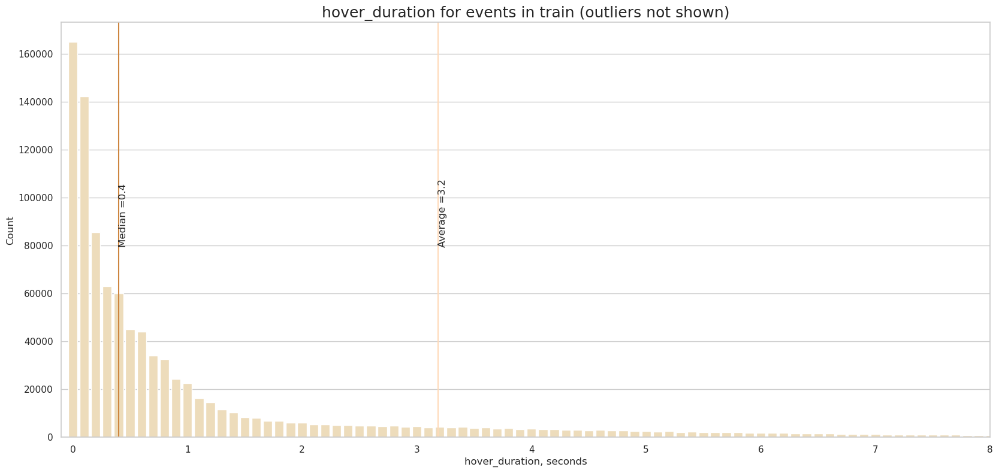

In [63]:
mean_hover_duration_train = hover_duration_train.mean()
median_hover_duration_train = hover_duration_train.median()
hover_duration_train_counts = np.round(hover_duration_train*10, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 9))
g = sns.barplot(x=hover_duration_train_counts.index, y=np.round(hover_duration_train_counts.values, 0), color='wheat')
plt.title('hover_duration for events in train (outliers not shown)', fontsize=18)
g.set_xticklabels(['{}'.format(int(num/10)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='hover_duration, seconds', ylabel='Count')
g.axvline(x=mean_hover_duration_train*10, color="peachpuff")
g.text(mean_hover_duration_train*10, 80000, f'Average ={round(mean_hover_duration_train, 1)}', rotation=90)
plt.axvline(x=median_hover_duration_train*10, color="peru")
plt.text(median_hover_duration_train*10, 80000, f'Median ={round(median_hover_duration_train, 1)}', rotation=90)
plt.xlim(-1, 8*10)
del mean_hover_duration_train, median_hover_duration_train, hover_duration_train_counts
plt.show()

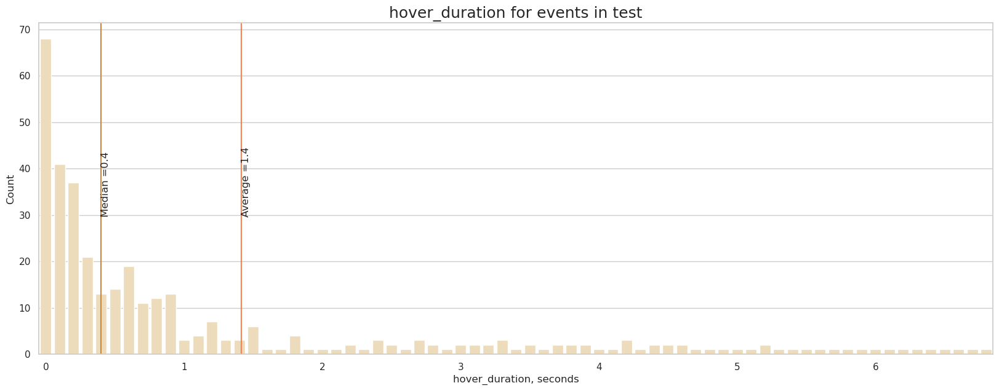

In [64]:
mean_hover_duration_test = hover_duration_test.mean()
median_hover_duration_test = hover_duration_test.median()
hover_duration_test_counts = np.round(hover_duration_test*10, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 7))
g = sns.barplot(x=hover_duration_test_counts.index, y=hover_duration_test_counts.values, color='wheat')
plt.title('hover_duration for events in test', fontsize=18)
g.set_xticklabels(['{}'.format(int(num/10)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='hover_duration, seconds', ylabel='Count')
g.axvline(x=mean_hover_duration_test*10, color="coral")
g.text(mean_hover_duration_test*10, 30, f'Average ={round(mean_hover_duration_test, 1)}', rotation=90)
g.axvline(x=median_hover_duration_test*10, color="peru")
g.text(median_hover_duration_test*10, 30, f'Median ={round(median_hover_duration_test, 1)}', rotation=90)
del mean_hover_duration_test, median_hover_duration_test, hover_duration_test_counts
plt.show()